<div style="text-align: center; font-size: 50px;">
    <b>Energy and Sensor mapping on Process Data</b>
</div>

In [1]:

import random
import itertools
import os
from datetime import datetime, timedelta
RANDOM_SEED = 42
random.seed(RANDOM_SEED)
#import simulation
import simpy
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import chardet
import plotly.io as pio
from pathlib import Path
import pm4py

import plotly.express as px

from pathlib import Path

import matplotlib.image as mpimg
import tempfile


pio.renderers.default='notebook'
pd.options.mode.chained_assignment = None

# Define Paths and Load Datasets

In [2]:
process_datasets = {}

## Process 2

In [3]:


# Define the path to the current file's location
current_path = Path(__file__).resolve().parent if '__file__' in globals() else Path().resolve()

# Define the folder path
files_folder_silver = current_path.parent / 'data' / 'silver' / 'process_2'

# Load the Parquet file
df = pd.read_parquet(files_folder_silver / "df_combined_legend.parquet")

display(df)

# Identify shared columns: those without 'l01' or 'l02' in the name, excluding 'datetime' and mat_id (but mat_id are shared)
shared_columns = [col for col in df.columns if not any(x in col.lower() for x in ['l01', 'l02']) and col not in ['datetime']]

# Columns for L01: those containing 'l01' (case insensitive), plus 'datetime', mat_id columns, and shared columns
l01_columns = ['datetime'] + [col for col in df.columns if 'l01' in col.lower()] + shared_columns

# Columns for L02: those containing 'l02' (case insensitive), plus 'datetime', mat_id columns, and shared columns
l02_columns = ['datetime'] + [col for col in df.columns if 'l02' in col.lower()] + shared_columns

# Create separate DataFrames
df_l01 = df[l01_columns].copy()
df_l02 = df[l02_columns].copy()

# Rename columns in df_l01 to remove 'l01' related suffixes/prefixes
df_l01.columns = [col.replace('_l01', '').replace('l01_', '').replace('l01', '') for col in df_l01.columns]

# Rename columns in df_l02 to remove 'l02' related suffixes/prefixes
df_l02.columns = [col.replace('_l02', '').replace('l02_', '').replace('l02', '') for col in df_l02.columns]

# Ensure both DataFrames have the same columns for appending (after renaming)
common_columns = list(set(df_l01.columns) & set(df_l02.columns))
df_l01 = df_l01[common_columns]
df_l02 = df_l02[common_columns]

# Append the DataFrames
df_expanded = pd.concat([df_l01.assign(temp_object='l01'), df_l02.assign(temp_object='l02')], ignore_index=True)

# Sort by temp_object and datetime to ensure proper ordering
df_expanded = df_expanded.sort_values(['temp_object', 'datetime']).reset_index(drop=True)

# Identify activity changes: group consecutive rows with the same status_name per object
df_expanded['activity_change'] = (df_expanded['status_name'] != df_expanded['status_name'].shift()).cumsum()

# Group by temp_object and activity_change to create activity intervals
activity_groups = df_expanded.groupby(['temp_object', 'activity_change'])

# Create a new DataFrame for activities
activity_rows = []
for (obj, change), group in activity_groups:
    group = group.sort_values('datetime')
    start_time = group['datetime'].min()
    end_time = group['datetime'].max()
    status = group['status_name'].iloc[0]

    row = group.iloc[0].copy()
    row['timestamp_start'] = start_time
    row['timestamp_end'] = end_time
    row['activity'] = status
    activity_rows.append(row)

df_activities = pd.DataFrame(activity_rows)

# Now set the required columns on df_activities
df_activities['higher_level_activity'] = 'shift'
df_activities['object_type'] = 'production_line'
df_activities['object'] = df_activities['temp_object']

# Define a function to determine the shift based on datetime hour
def get_shift(dt):
    hour = dt.hour
    if 6 <= hour < 14:
        return '1'
    elif 14 <= hour < 22:
        return '2'
    else:
        return '3'

df_activities['case_id'] = 'shift_' + df_activities['timestamp_start'].apply(get_shift) + '_' + df_activities['timestamp_start'].dt.date.astype(str)

# FIX 1: Use df_activities.columns (not df.columns) — mat_id cols must exist in df_activities at this point
mat_id_cols = [col for col in df_activities.columns if
               col.startswith('mat_id_m01_') or
               col.startswith('mat_id_m02_') or
               col.startswith('mat_id_m03_')]

df_activities['object_attributes'] = df_activities.apply(
    lambda row: {col: row[col] for col in mat_id_cols},
    axis=1
)

# Drop unwanted columns: schritt_, mat_id_m01_, mat_id_m02_, mat_id_m03_, status_name, temp_object, activity_change
df_activities = df_activities.drop(columns=[col for col in df_activities.columns if
    'schritt_' in col or 'mat_id_m01_' in col or 'mat_id_m02_' in col or 'mat_id_m03_' in col or
    col in ['status_name', 'temp_object', 'activity_change']], errors='ignore')

# Add _log suffix to activity columns
activity_cols = ['case_id', 'activity', 'timestamp_start', 'timestamp_end', 'object', 'object_type', 'higher_level_activity', 'object_attributes']
df_activities = df_activities.rename(columns={col: col + '_log' for col in activity_cols if col in df_activities.columns})

# Add _energy suffix to remaining sensor/datetime columns
sensor_cols = [col for col in df_activities.columns if not col.endswith('_log')]
df_activities = df_activities.rename(columns={col: col + '_energy' for col in sensor_cols if col in df_activities.columns})

# Initialize log columns in df_expanded with None
log_columns = [col for col in df_activities.columns if col.endswith('_log')]
for col in log_columns:
    df_expanded[col] = None

# FIX 2: When assigning dict values, wrap in a list to prevent pandas unpacking the dict into columns
for obj in df_expanded['temp_object'].unique():
    df_obj = df_expanded[df_expanded['temp_object'] == obj]
    df_act_obj = df_activities[df_activities['object_log'] == obj]

    for _, act_row in df_act_obj.iterrows():
        mask = (
            (df_obj['datetime'] >= act_row['timestamp_start_log']) &
            (df_obj['datetime'] <= act_row['timestamp_end_log'])
        )
        matched_index = df_obj[mask].index
        for col in log_columns:
            val = act_row[col]
            if isinstance(val, dict):
                # Wrap in list to stop pandas unpacking the dict across columns
                df_expanded.loc[matched_index, col] = [val] * len(matched_index)
            else:
                df_expanded.loc[matched_index, col] = val

# Drop temp_object, activity_change, and mat_id columns (now stored in object_attributes_log)
df_expanded = df_expanded.drop(columns=['temp_object', 'activity_change'] +
    [col for col in df_expanded.columns if
     'mat_id_m01_' in col or 'mat_id_m02_' in col or 'mat_id_m03_' in col], errors='ignore')

# Rename all non-log columns (sensor + datetime) to _energy
sensor_cols_combined = [col for col in df_expanded.columns if not col.endswith('_log')]
df_expanded = df_expanded.rename(columns={col: col + '_energy' for col in sensor_cols_combined})

df_expanded['timestamp_start_log'] = pd.to_datetime(df_expanded['timestamp_start_log'])
df_expanded['timestamp_end_log'] = pd.to_datetime(df_expanded['timestamp_end_log'])

df_expanded = df_expanded.drop(columns=['schritt__energy'], errors='ignore')
df_expanded.columns = [col.replace('__', '_') for col in df_expanded.columns]

print(f"Expanded df")
display(df_expanded)

# Extract only the event log
df = df_expanded.copy()

# Keep only columns ending with '_log'
df = df[[col for col in df.columns if col.endswith('_log')]]

# Remove '_log' suffix
df.columns = [col.replace('_log', '') for col in df.columns]

df_event_log = df.copy()

# Remove duplicate rows where all values are the same, excluding dict columns
# (drop_duplicates can't handle dicts, so exclude 'object_attributes' column)
subset_cols = [col for col in df_event_log.columns if col != 'object_attributes']
df_event_log = df_event_log.drop_duplicates(subset=subset_cols)

print(f"Event log")
display(df_event_log)

### Prodcution plan
df = df_event_log.copy()
df = df[['case_id', 'activity', 'timestamp_start', 'timestamp_end', 'object_attributes']]

# Only leave the case ids, the oders
df = df.drop_duplicates(subset=['case_id'])

production_plan = df.copy()

print(f"production plan")
display(production_plan)

process_datasets['process_2'] = {
    'expanded': df_expanded,
    'event_log': df_event_log,
    'production_plan': production_plan
}

,datetime,schritt_l01_,pro_menge_l01_kg,pro_menge_l02_kg,schritt_l02_,pro_temp_out_l01_,pro_temp_out_l02_,mat_id_m01_,mat_id_m02_,mat_id_m03_,...,medium_temp_ein_l01,medium_temp_ein_l02_,dampfmenge_kg/h_nmb+cip_,cip_turm_f_,cip_turm_g_,status_name_l01,status_name_l02,pro_power_kW_l01,pro_power_kW_l02,medium_power_kW
0,2024-11-03 14:03:21,0,0.0,0.0,0,31.201172,29.909939,0,0,0,...,33.582901,30.777994,574.001709,0,0,Grundstellung,Grundstellung,0.000000,0.0,334.834330
1,2024-11-03 14:03:26,0,0.0,0.0,0,31.201172,29.915365,0,0,0,...,33.582901,30.777994,533.130798,0,0,Grundstellung,Grundstellung,0.000000,0.0,310.992966
2,2024-11-03 14:03:31,0,0.0,0.0,0,31.201172,29.909939,0,0,0,...,33.582901,30.777994,497.685181,0,0,Grundstellung,Grundstellung,0.000000,0.0,290.316355
3,2024-11-03 14:03:36,0,0.0,0.0,0,31.201172,29.909939,0,0,0,...,33.582901,30.772570,485.387726,0,0,Grundstellung,Grundstellung,0.000000,0.0,283.142840
4,2024-11-03 14:03:41,0,0.0,0.0,0,31.195747,29.909939,0,0,0,...,33.582901,30.783421,498.408569,0,0,Grundstellung,Grundstellung,0.000000,0.0,290.738332
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368723,2024-11-24 22:10:16,0,0.0,0.0,0,63.677299,26.844618,0,0,0,...,69.238281,28.059896,3.978588,0,30,Grundstellung,Grundstellung,1020.215826,0.0,2.320843
368724,2024-11-24 22:10:21,0,0.0,0.0,0,63.709854,26.844618,0,0,0,...,69.194878,28.054470,0.000000,0,30,Grundstellung,Grundstellung,1031.460454,0.0,0.000000
368725,2024-11-24 22:10:26,0,0.0,0.0,0,63.736980,26.844618,0,0,0,...,69.135201,28.059896,0.000000,0,30,Grundstellung,Grundstellung,1042.125419,0.0,0.000000
368726,2024-11-24 22:10:31,0,0.0,0.0,0,63.764107,26.833767,0,0,0,...,69.102646,28.054470,0.000000,0,30,Grundstellung,Grundstellung,1052.476826,0.0,0.000000


Expanded df


,datetime_energy,medium_power_kW_energy,pro_temp_out_energy,pro_power_kW_energy,status_name_energy,pro_volstrom_l/h_energy,cip_turm_g_energy,pro_menge_kg_energy,dampfmenge_kg/h_nmb+cip_energy,cip_turm_f_energy,timestamp_start_log,timestamp_end_log,activity_log,higher_level_activity_log,object_type_log,object_log,case_id_log,object_attributes_log
0,2024-11-03 14:03:21,334.834330,31.201172,0.0,Grundstellung,0.0,0,0.0,574.001709,0,2024-11-03 14:03:21,2024-11-04 08:58:21,Grundstellung,shift,production_line,l01,shift_2_2024-11-03,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
1,2024-11-03 14:03:26,310.992966,31.201172,0.0,Grundstellung,0.0,0,0.0,533.130798,0,2024-11-03 14:03:21,2024-11-04 08:58:21,Grundstellung,shift,production_line,l01,shift_2_2024-11-03,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
2,2024-11-03 14:03:31,290.316355,31.201172,0.0,Grundstellung,0.0,0,0.0,497.685181,0,2024-11-03 14:03:21,2024-11-04 08:58:21,Grundstellung,shift,production_line,l01,shift_2_2024-11-03,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
3,2024-11-03 14:03:36,283.142840,31.201172,0.0,Grundstellung,0.0,0,0.0,485.387726,0,2024-11-03 14:03:21,2024-11-04 08:58:21,Grundstellung,shift,production_line,l01,shift_2_2024-11-03,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
4,2024-11-03 14:03:41,290.738332,31.195747,0.0,Grundstellung,0.0,0,0.0,498.408569,0,2024-11-03 14:03:21,2024-11-04 08:58:21,Grundstellung,shift,production_line,l01,shift_2_2024-11-03,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736981,2024-11-24 22:10:16,2.320843,26.844618,0.0,Grundstellung,0.0,30,0.0,3.978588,0,2024-11-22 19:47:01,2024-11-24 22:10:36,Grundstellung,shift,production_line,l02,shift_2_2024-11-22,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
736982,2024-11-24 22:10:21,0.000000,26.844618,0.0,Grundstellung,0.0,30,0.0,0.000000,0,2024-11-22 19:47:01,2024-11-24 22:10:36,Grundstellung,shift,production_line,l02,shift_2_2024-11-22,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
736983,2024-11-24 22:10:26,0.000000,26.844618,0.0,Grundstellung,0.0,30,0.0,0.000000,0,2024-11-22 19:47:01,2024-11-24 22:10:36,Grundstellung,shift,production_line,l02,shift_2_2024-11-22,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
736984,2024-11-24 22:10:31,0.000000,26.833767,0.0,Grundstellung,0.0,30,0.0,0.000000,0,2024-11-22 19:47:01,2024-11-24 22:10:36,Grundstellung,shift,production_line,l02,shift_2_2024-11-22,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."


Event log


,timestamp_start,timestamp_end,activity,higher_level_activity,object_type,object,case_id,object_attributes
0,2024-11-03 14:03:21,2024-11-04 08:58:21,Grundstellung,shift,production_line,l01,shift_2_2024-11-03,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
13621,2024-11-04 08:58:26,2024-11-04 08:59:01,Vorwärmen des Warmwasserkreislaufs,shift,production_line,l01,shift_1_2024-11-04,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
13629,2024-11-04 08:59:06,2024-11-04 10:13:56,Warten auf Ziel,shift,production_line,l01,shift_1_2024-11-04,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
14528,2024-11-04 10:14:01,2024-11-04 10:14:06,Materialvalidierung,shift,production_line,l01,shift_1_2024-11-04,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
14530,2024-11-04 10:14:11,2024-11-04 10:17:41,Leitung zum Vorheizer füllen,shift,production_line,l01,shift_1_2024-11-04,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
...,...,...,...,...,...,...,...,...
700619,2024-11-22 19:39:56,2024-11-22 19:43:41,Produktion,shift,production_line,l02,shift_2_2024-11-22,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
700665,2024-11-22 19:43:46,2024-11-22 19:46:06,Spülen mit Wasser,shift,production_line,l02,shift_2_2024-11-22,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
700694,2024-11-22 19:46:11,2024-11-22 19:46:21,Nachlauf,shift,production_line,l02,shift_2_2024-11-22,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
700697,2024-11-22 19:46:26,2024-11-22 19:46:56,Spülen auf Gully,shift,production_line,l02,shift_2_2024-11-22,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."


production plan


,case_id,activity,timestamp_start,timestamp_end,object_attributes
0,shift_2_2024-11-03,Grundstellung,2024-11-03 14:03:21,2024-11-04 08:58:21,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
13621,shift_1_2024-11-04,Vorwärmen des Warmwasserkreislaufs,2024-11-04 08:58:26,2024-11-04 08:59:01,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
17443,shift_2_2024-11-04,Materialvalidierung,2024-11-04 14:16:56,2024-11-04 14:17:01,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
24457,shift_3_2024-11-05,Materialvalidierung,2024-11-05 00:01:26,2024-11-05 00:01:31,"{'mat_id_m03_': 8681588, 'mat_id_m02_': 868158..."
28917,shift_1_2024-11-05,Materialvalidierung,2024-11-05 06:13:06,2024-11-05 06:13:11,"{'mat_id_m03_': 8681588, 'mat_id_m02_': 868158..."
35138,shift_2_2024-11-05,Materialvalidierung,2024-11-05 14:51:31,2024-11-05 14:51:31,"{'mat_id_m03_': 0, 'mat_id_m02_': 8681588, 'ma..."
42561,shift_3_2024-11-06,Materialvalidierung,2024-11-06 01:10:06,2024-11-06 01:10:06,"{'mat_id_m03_': 8681588, 'mat_id_m02_': 0, 'ma..."
46446,shift_1_2024-11-06,Materialvalidierung,2024-11-06 06:33:51,2024-11-06 06:33:51,"{'mat_id_m03_': 0, 'mat_id_m02_': 8681588, 'ma..."
52306,shift_2_2024-11-06,Materialvalidierung,2024-11-06 14:43:01,2024-11-06 14:43:06,"{'mat_id_m03_': 8681588, 'mat_id_m02_': 868158..."
59401,shift_3_2024-11-07,Materialvalidierung,2024-11-07 00:34:26,2024-11-07 00:34:26,"{'mat_id_m03_': 0, 'mat_id_m02_': 8681588, 'ma..."


In [4]:
variable = 'pro_volstrom_l/h_energy'

In [5]:

df = df_expanded.copy()

# Assuming your dataframe is named 'df' with columns 'datetime_energy' and 'n'
# Filter by the specific day
filtered_df = df[df['datetime_energy'].dt.date == pd.to_datetime('2024-11-07').date()]

# Create the plot
fig = px.line(filtered_df, x='datetime_energy', y=variable, title='Energy Demand on 2024-11-07')
fig.show()

## Process 4

In [6]:
objects_to_analyze = ['Erhitzer']

In [7]:
# Define the path to the current file's location
current_path = Path(__file__).resolve().parent if '__file__' in globals() else Path().resolve()

# Define the folder path
files_folder_silver = current_path.parent / 'data' / 'silver' / 'process_4'

## Get the sensor data
# Strom in kWh und Dampf in kg
df_energy = pd.read_parquet(files_folder_silver/"df_sensor_joined.parquet")
print(df_energy.columns)

# Assuming 'datetime' is the timestamp column
df_energy['datetime'] = pd.to_datetime(df_energy['datetime'])
df_energy.set_index('datetime', inplace=True)

# Resample by minute and aggregate (e.g., mean for averages, sum for totals - adjust as needed)
df_energy = df_energy.resample('min').mean()  # or .sum() if appropriate

df_energy.reset_index(inplace=True)


### Get the log data
# Load the Parquet file
df = pd.read_parquet(files_folder_silver / "df_events.parquet")


df_with_higher_level = df[df['higher_level_activity'].notna()].copy()


df_higher_level = df[df['higher_level_activity'].isna() & (df['activity'] == 'production')].copy()

def find_matching_higher_level(row):

    matches = df_higher_level[
        (df_higher_level['timestamp_start'] <= row['timestamp_start']) &
        (df_higher_level['timestamp_end'] >= row['timestamp_end'])
    ]
    if not matches.empty:

        match = matches.iloc[0]
        return match['case_id'], match['object_attributes']
    else:
        return None, None

# Apply the function to each row in df_with_higher_level
df_with_higher_level[['matched_case_id', 'matched_object_attributes']] = df_with_higher_level.apply(
    lambda row: pd.Series(find_matching_higher_level(row)), axis=1
)

# Now, update the case_id and merge object_attributes
df_with_higher_level['case_id'] = df_with_higher_level['matched_case_id']
# For object_attributes, you can merge or update as needed. Assuming you want to add the higher level's attributes
df_with_higher_level['object_attributes'] = df_with_higher_level.apply(
    lambda row: {**row['object_attributes'], **row['matched_object_attributes']} if row['matched_object_attributes'] else row['object_attributes'],
    axis=1
)

# Drop the temporary columns
df_with_higher_level = df_with_higher_level.drop(columns=['matched_case_id', 'matched_object_attributes'])

# Now, combine the updated lower-level activities with the unchanged higher-level activities
df_final = pd.concat([df_with_higher_level, df_higher_level], ignore_index=True)

# Sort by timestamp_start for better order
df_event_log = df_final.sort_values(by='timestamp_start').reset_index(drop=True)


# Filter for rows where object == 'order'
df_orders = df_event_log[df_event_log['object_type'] == 'order'].copy()

# Group by case_id and find the maximum timestamp_end for each case_id
max_ends = df_orders.groupby('case_id')['timestamp_end'].max()

# Prepare a list to hold new rows
new_rows = []

# For each case_id, create a new activity row
for case_id, max_end in max_ends.items():
    # Get the original row for this case_id (assuming there's one per case_id for 'order')
    original_row = df_orders[df_orders['case_id'] == case_id].iloc[0]
    
    # Create the new row with the same properties, but new activity and timestamps
    new_row = {
        'case_id': case_id,
        'activity': 'end',  # New activity name; adjust if needed
        'timestamp_start': max_end + pd.Timedelta(seconds=1),
        'timestamp_end': max_end + pd.Timedelta(seconds=1),  # Ends at the same moment as start (zero duration)
        'object_type': 'order',
        'object': original_row['object'],
        'higher_level_activity': original_row['higher_level_activity'],
        'object_attributes': original_row['object_attributes']
    }
    new_rows.append(new_row)

# Convert new rows to DataFrame
df_new = pd.DataFrame(new_rows)

# Append the new rows to df_event_log
df = pd.concat([df_event_log, df_new], ignore_index=True)

# Sort the DataFrame by timestamp_start for proper ordering
df_event_log = df_event_log.sort_values(by='timestamp_start').reset_index(drop=True)

df_event_log = df_event_log[df_event_log['object'].isin(objects_to_analyze)]

print(f"Event log")
display(df_event_log)


### Get the expanded df with sensor data

def expand_activities_to_timeseries(df_activities, df_energy, energy_cols=None):
    """
    For each activity, filter df_energy to the [timestamp_start, timestamp_end) interval,
    then create rows combining activity info with each energy timestamp's data.
    Append all into one DataFrame, preserving the complete time series per activity.
    """
    if energy_cols is None:
        energy_cols = [col for col in df_energy.columns if col != 'datetime']
    
    expanded_rows = []
    
    for _, activity_row in df_activities.iterrows():
        start = activity_row['timestamp_start_log']
        end = activity_row['timestamp_end_log']
        
        # Filter energy data within the activity's time interval
        mask = (df_energy['datetime_energy'] >= start) & (df_energy['datetime_energy'] < end)
        energy_subset = df_energy.loc[mask, ['datetime_energy'] + energy_cols]
        
        # Create new rows: activity data + each energy row
        for _, energy_row in energy_subset.iterrows():
            new_row = activity_row.to_dict()
            new_row.update(energy_row.to_dict())  # Merge energy data
            expanded_rows.append(new_row)
    
    return pd.DataFrame(expanded_rows)

# Rename columns in df_final_clean to add suffix '_log'
df_activites = df_event_log.add_suffix('_log')

# Rename columns in df_energy to add prefix '_sen', except 'datetime'
df_energys = df_energy.add_suffix('_energy')

# Usage: Use all sensor columns
df_expanded = expand_activities_to_timeseries(df_activites, df_energys)

# View result
print("Expanded df with sensor data")
display(df_expanded)


## Get the production plan
df = df_event_log.copy()

df = df[df['object'].isin(objects_to_analyze)]

df = df[['case_id', 'activity', 'timestamp_start', 'timestamp_end', 'object_attributes']]

df = df.dropna(subset=['case_id'])

df = df.drop_duplicates(subset=['case_id'])

production_plan = df.copy()

print("Expanded production plan")
display(production_plan)


process_datasets['process_4'] = {
    'expanded': df_expanded,
    'event_log': df_event_log,
    'production_plan': production_plan
}


Index(['datetime', 'temp_Auslauf_EG_(WT2)_5s', 'temp_Einlauf_EG_(WT_2)_5s',
       'flow_Kuehlturmwasser_30120FT701_5s', 'flow_Kaltwasser_(WT7)_5s',
       'Kuehlturmwassertemp_(WT6)_5s', 'Kaltwassertemp_(WT_7)_5s',
       'nach_Kuehler_(WT7)_5s', 'temp_nach_Kuehlturmkuehler_(WT6)_5s',
       'Fuellstand_Steriltank_30140LT001_5s',
       'Fuellstand_Steriltank_30141LT001_5s', 'flow_Dampf_WT3a/5a)_5s',
       'flow_Heisswasser_30120FT721(WT5a)_5s',
       'temp_nach_WR2,_vor_Druckerhoehungspumpe_(WT4)_5s',
       'temp_nach_Erhitzer_(WT5)_5s', 'temp_nach_WR2_(WT2)_5s',
       'temp_nach_Austauscher_2_(WT4)_5s', 'Druck_HW_Anwaermer_(WT3a)_5s',
       'temp_HW_Anwaermer_(WT3a)_5s', 'temp_Produkt_Einlauf_30110TT001_1h',
       'flow_Vorlaufpumpe_30110FT301_1h', 'temp_vor_Vorwärmer_(WT_2)_1h',
       'strom_PERT2_KZE_5s', 'dampf_PET2_KZE_5s', 'strom_gesamt_PERT2_KZE_15m',
       'dampf_gesamt_PET2_KZE_15m'],
      dtype='object')
Event log


,case_id,activity,timestamp_start,timestamp_end,object,object_type,higher_level_activity,object_attributes
5,10705690.0,Step-032 = Umlauf,2024-08-01 07:58:56,2024-08-01 08:01:27,Erhitzer,heating_machine,production,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE..."
7,10705690.0,Step-030 = Produktion,2024-08-01 08:01:27,2024-08-01 08:41:47,Erhitzer,heating_machine,production,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE..."
21,10705690.0,Step-032 = Umlauf,2024-08-01 08:41:47,2024-08-01 08:44:26,Erhitzer,heating_machine,production,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE..."
23,10705690.0,Step-030 = Produktion,2024-08-01 08:44:26,2024-08-01 09:14:02,Erhitzer,heating_machine,production,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE..."
33,10705690.0,Step-032 = Umlauf,2024-08-01 09:14:02,2024-08-01 09:17:22,Erhitzer,heating_machine,production,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE..."
...,...,...,...,...,...,...,...,...
7737,10709874.0,Step-032 = Umlauf,2024-08-30 16:22:44,2024-08-30 16:23:08,Erhitzer,heating_machine,production,"{'attr_product': 'BF 0,75 GRSEN MINTY MELON G ..."
7740,10709874.0,Step-035 = Ausschub Anlage,2024-08-30 16:23:08,2024-08-30 16:38:35,Erhitzer,heating_machine,production,"{'attr_product': 'BF 0,75 GRSEN MINTY MELON G ..."
7756,10709874.0,Step-020 = Sterilwasserumlauf (über VLG),2024-08-30 16:38:35,2024-08-30 17:05:46,Erhitzer,heating_machine,production,"{'attr_product': 'BF 0,75 GRSEN MINTY MELON G ..."
7770,10709874.0,Step-046 = Anlage Abfahren,2024-08-30 17:05:46,2024-08-30 17:08:18,Erhitzer,heating_machine,production,"{'attr_product': 'BF 0,75 GRSEN MINTY MELON G ..."


Expanded df with sensor data


,case_id_log,activity_log,timestamp_start_log,timestamp_end_log,object_log,object_type_log,higher_level_activity_log,object_attributes_log,datetime_energy,temp_Auslauf_EG_(WT2)_5s_energy,...,temp_nach_Austauscher_2_(WT4)_5s_energy,Druck_HW_Anwaermer_(WT3a)_5s_energy,temp_HW_Anwaermer_(WT3a)_5s_energy,temp_Produkt_Einlauf_30110TT001_1h_energy,flow_Vorlaufpumpe_30110FT301_1h_energy,temp_vor_Vorwärmer_(WT_2)_1h_energy,strom_PERT2_KZE_5s_energy,dampf_PET2_KZE_5s_energy,strom_gesamt_PERT2_KZE_15m_energy,dampf_gesamt_PET2_KZE_15m_energy
0,10705690.0,Step-032 = Umlauf,2024-08-01 07:58:56,2024-08-01 08:01:27,Erhitzer,heating_machine,production,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE...",2024-08-01 07:59:00,55.000000,...,59.283333,2.142500,49.225000,13.079242,23842.808312,55.764476,32.326554,2.000000,NaN,NaN
1,10705690.0,Step-032 = Umlauf,2024-08-01 07:58:56,2024-08-01 08:01:27,Erhitzer,heating_machine,production,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE...",2024-08-01 08:00:00,54.141666,...,58.675000,2.140000,49.175000,14.307994,23808.330952,56.251558,33.030047,2.000000,1.440766e+06,2624.356755
2,10705690.0,Step-032 = Umlauf,2024-08-01 07:58:56,2024-08-01 08:01:27,Erhitzer,heating_machine,production,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE...",2024-08-01 08:01:00,54.041666,...,58.791666,2.140000,49.166667,14.307994,23808.330952,56.251558,29.784157,2.000000,NaN,NaN
3,10705690.0,Step-030 = Produktion,2024-08-01 08:01:27,2024-08-01 08:41:47,Erhitzer,heating_machine,production,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE...",2024-08-01 08:02:00,54.991666,...,59.941667,2.140833,49.133333,14.307994,23808.330952,56.251558,25.414900,2.000000,NaN,NaN
4,10705690.0,Step-030 = Produktion,2024-08-01 08:01:27,2024-08-01 08:41:47,Erhitzer,heating_machine,production,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE...",2024-08-01 08:03:00,55.766667,...,60.375000,2.150000,49.124999,14.307994,23808.330952,56.251558,25.833941,2.000000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30037,10709874.0,Step-020 = Sterilwasserumlauf (über VLG),2024-08-30 16:38:35,2024-08-30 17:05:46,Erhitzer,heating_machine,production,"{'attr_product': 'BF 0,75 GRSEN MINTY MELON G ...",2024-08-30 17:04:00,60.000000,...,63.233334,3.153333,59.766666,16.322765,7656.582050,39.037747,23.619027,2.000000,NaN,NaN
30038,10709874.0,Step-020 = Sterilwasserumlauf (über VLG),2024-08-30 16:38:35,2024-08-30 17:05:46,Erhitzer,heating_machine,production,"{'attr_product': 'BF 0,75 GRSEN MINTY MELON G ...",2024-08-30 17:05:00,59.950001,...,63.241667,3.146667,60.008333,16.322765,7656.582050,39.037747,23.692123,2.000000,NaN,NaN
30039,10709874.0,Step-046 = Anlage Abfahren,2024-08-30 17:05:46,2024-08-30 17:08:18,Erhitzer,heating_machine,production,"{'attr_product': 'BF 0,75 GRSEN MINTY MELON G ...",2024-08-30 17:06:00,59.375001,...,68.433334,2.896667,43.775000,16.322765,7656.582050,39.037747,20.385727,2.000000,NaN,NaN
30040,10709874.0,Step-046 = Anlage Abfahren,2024-08-30 17:05:46,2024-08-30 17:08:18,Erhitzer,heating_machine,production,"{'attr_product': 'BF 0,75 GRSEN MINTY MELON G ...",2024-08-30 17:07:00,49.400000,...,75.209091,2.810000,30.090909,16.322765,7656.582050,39.037747,20.852771,2.000000,NaN,NaN


Expanded production plan


,case_id,activity,timestamp_start,timestamp_end,object_attributes
5,10705690.0,Step-032 = Umlauf,2024-08-01 07:58:56,2024-08-01 08:01:27,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE..."
150,10705688.0,Step-032 = Umlauf,2024-08-01 15:22:53,2024-08-01 15:32:54,"{'attr_product': 'BF 1,00 GR WeißeGrapefr N D0..."
187,10705695.0,Step-032 = Umlauf,2024-08-01 16:30:43,2024-08-01 16:33:07,"{'attr_product': 'BF 1,00 GR PinkGrapefruit D ..."
255,10705698.0,Step-035 = Ausschub Anlage,2024-08-01 22:09:34,2024-08-01 22:21:50,"{'attr_product': 'BF 1,00 GRTG PinkGrapefruit ..."
318,10705696.0,Step-032 = Umlauf,2024-08-02 01:29:22,2024-08-02 01:36:16,"{'attr_product': 'BF 1,00 GRTG Multi 50% N DE ..."
628,10705703.0,Step-046 = Anlage Abfahren,2024-08-02 16:18:28,2024-08-02 16:20:15,"{'attr_product': 'BF 1,00 GRTG Orange 50% N DE..."
688,10706584.0,Step-032 = Umlauf,2024-08-05 04:38:22,2024-08-05 04:38:48,"{'attr_product': 'BF 0,85 HCAIO BEAUTY S DE PE..."
835,10706585.0,Step-035 = Ausschub Anlage,2024-08-05 22:48:58,2024-08-05 23:09:47,"{'attr_product': 'BF 0,85 HCAIO EVERYDAY S DE ..."
1106,10706583.0,Step-020 = Sterilwasserumlauf (über VLG),2024-08-06 11:40:51,2024-08-06 12:20:44,"{'attr_product': 'BF 0,85 HCAIO RELOAD S DE PE..."
1484,10706576.0,Step-032 = Umlauf,2024-08-07 08:42:05,2024-08-07 08:42:07,"{'attr_product': 'BF 1,00 GRTG AppleCherry N D..."


# Model the process

In [8]:
# Functions

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.spatial.distance import jensenshannon
from collections import Counter
import pm4py
import tempfile
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pm4py

def comprehensive_simulation_evaluation(simulated_df, real_df, case_col='case_id', 
                                       activity_col='activity', start_col='timestamp_start', 
                                       end_col='timestamp_end'):
    """
    Comprehensive evaluation of simulation quality based on process mining literature
    
    Metrics based on:
    - Rozinat et al. (2008): Conformance checking of processes based on monitoring real behavior
    - van der Aalst et al. (2010): Process mining manifesto
    - Burattin & Sperduti (2010): Automatic determination of parameters' values for heuristics miner++
    """
    
    results = {}
    
    print("="*80)
    print("COMPREHENSIVE SIMULATION EVALUATION")
    print("="*80)
    
    # ========== 1. BASIC PROCESS METRICS ==========
    print("\n1. BASIC PROCESS METRICS")
    print("-" * 40)
    
    # Event counts
    sim_events = len(simulated_df)
    real_events = len(real_df)
    event_ratio = sim_events / real_events if real_events > 0 else 0
    
    # Case counts  
    sim_cases = simulated_df[case_col].nunique()
    real_cases = real_df[case_col].nunique()
    case_ratio = sim_cases / real_cases if real_cases > 0 else 0
    
    print(f"Events - Real: {real_events}, Sim: {sim_events}, Ratio: {event_ratio:.3f}")
    print(f"Cases - Real: {real_cases}, Sim: {sim_cases}, Ratio: {case_ratio:.3f}")
    
    results['basic_metrics'] = {
        'event_count_ratio': event_ratio,
        'case_count_ratio': case_ratio,
        'event_count_error': abs(1 - event_ratio),
        'case_count_error': abs(1 - case_ratio)
    }
    
    # ========== 2. ACTIVITY FREQUENCY ANALYSIS ==========
    print("\n2. ACTIVITY FREQUENCY ANALYSIS")
    print("-" * 40)
    
    # Activity frequencies
    sim_activity_freq = simulated_df[activity_col].value_counts(normalize=True).sort_index()
    real_activity_freq = real_df[activity_col].value_counts(normalize=True).sort_index()
    
    # Align activities (handle missing activities)
    all_activities = set(sim_activity_freq.index) | set(real_activity_freq.index)
    sim_freq_aligned = pd.Series([sim_activity_freq.get(act, 0) for act in all_activities], index=all_activities)
    real_freq_aligned = pd.Series([real_activity_freq.get(act, 0) for act in all_activities], index=all_activities)
    
    # Jensen-Shannon divergence for activity distributions
    js_divergence = jensenshannon(sim_freq_aligned.values, real_freq_aligned.values)
    
    # Mean Absolute Error of frequencies
    freq_mae = np.mean(np.abs(sim_freq_aligned.values - real_freq_aligned.values))
    
    print(f"Activity Coverage - Real: {len(real_activity_freq)}, Sim: {len(sim_activity_freq)}")
    print(f"Jensen-Shannon Divergence (activities): {js_divergence:.4f} (0=perfect, 1=worst)")
    print(f"Mean Absolute Error (frequencies): {freq_mae:.4f}")
    
    results['activity_metrics'] = {
        'js_divergence': js_divergence,
        'frequency_mae': freq_mae,
        'activity_coverage_ratio': len(sim_activity_freq) / len(real_activity_freq) if len(real_activity_freq) > 0 else 0
    }
    
    # ========== 3. DURATION ANALYSIS ==========
    print("\n3. DURATION ANALYSIS")
    print("-" * 40)
    
    # Calculate durations
    sim_durations = (simulated_df[end_col] - simulated_df[start_col]).dt.total_seconds() / 60
    real_durations = (real_df[end_col] - real_df[start_col]).dt.total_seconds() / 60
    
    # Statistical comparison
    duration_ks_stat, duration_ks_pvalue = stats.ks_2samp(sim_durations, real_durations)
    
    # Duration statistics comparison
    duration_stats = pd.DataFrame({
        'Real': [real_durations.mean(), real_durations.median(), real_durations.std()],
        'Simulated': [sim_durations.mean(), sim_durations.median(), sim_durations.std()],
    }, index=['Mean', 'Median', 'Std'])
    
    duration_stats['Error'] = np.abs(duration_stats['Simulated'] - duration_stats['Real']) / duration_stats['Real']
    
    print("Duration Statistics:")
    print(duration_stats.round(3))
    print(f"\nKolmogorov-Smirnov Test: KS={duration_ks_stat:.4f}, p-value={duration_ks_pvalue:.4f}")
    print(f"(p > 0.05 suggests distributions are similar)")
    
    results['duration_metrics'] = {
        'ks_statistic': duration_ks_stat,
        'ks_pvalue': duration_ks_pvalue,
        'mean_duration_error': duration_stats.loc['Mean', 'Error'],
        'median_duration_error': duration_stats.loc['Median', 'Error'],
        'std_duration_error': duration_stats.loc['Std', 'Error']
    }
    
    # ========== 4. CASE-LEVEL ANALYSIS ==========
    print("\n4. CASE-LEVEL ANALYSIS")
    print("-" * 40)
    
    # Events per case
    sim_events_per_case = simulated_df.groupby(case_col).size()
    real_events_per_case = real_df.groupby(case_col).size()
    
    # Statistical test for events per case
    events_per_case_ks, events_per_case_pvalue = stats.ks_2samp(sim_events_per_case, real_events_per_case)
    
    case_stats = pd.DataFrame({
        'Real': [real_events_per_case.mean(), real_events_per_case.median(), real_events_per_case.std()],
        'Simulated': [sim_events_per_case.mean(), sim_events_per_case.median(), sim_events_per_case.std()],
    }, index=['Mean', 'Median', 'Std'])
    
    case_stats['Error'] = np.abs(case_stats['Simulated'] - case_stats['Real']) / case_stats['Real']
    
    print("Events per Case Statistics:")
    print(case_stats.round(3))
    print(f"\nKS Test (events per case): KS={events_per_case_ks:.4f}, p-value={events_per_case_pvalue:.4f}")
    
    results['case_metrics'] = {
        'events_per_case_ks': events_per_case_ks,
        'events_per_case_pvalue': events_per_case_pvalue,
        'mean_events_per_case_error': case_stats.loc['Mean', 'Error'],
        'median_events_per_case_error': case_stats.loc['Median', 'Error']
    }
    
    # ========== 5. CONTROL-FLOW ANALYSIS ==========
    print("\n5. CONTROL-FLOW ANALYSIS (Directly-Follows Graph)")
    print("-" * 40)
    
    # Create event logs for pm4py
    sim_log = pm4py.format_dataframe(simulated_df, case_id=case_col, activity_key=activity_col, timestamp_key=start_col)
    real_log = pm4py.format_dataframe(real_df, case_id=case_col, activity_key=activity_col, timestamp_key=start_col)
    
    # Discover DFGs
    sim_dfg, sim_start, sim_end = pm4py.discover_dfg(sim_log)
    real_dfg, real_start, real_end = pm4py.discover_dfg(real_log)
    
    # Compare DFG edges
    sim_edges = set(sim_dfg.keys())
    real_edges = set(real_dfg.keys())
    
    edge_precision = len(sim_edges & real_edges) / len(sim_edges) if len(sim_edges) > 0 else 0
    edge_recall = len(sim_edges & real_edges) / len(real_edges) if len(real_edges) > 0 else 0
    edge_f1 = 2 * (edge_precision * edge_recall) / (edge_precision + edge_recall) if (edge_precision + edge_recall) > 0 else 0
    
    print(f"DFG Edges - Real: {len(real_edges)}, Sim: {len(sim_edges)}, Common: {len(sim_edges & real_edges)}")
    print(f"Edge Precision: {edge_precision:.4f}")
    print(f"Edge Recall: {edge_recall:.4f}")
    print(f"Edge F1-Score: {edge_f1:.4f}")
    
    # Compare start/end activities (convert dict keys to sets)
    sim_start_set = set(sim_start.keys())
    real_start_set = set(real_start.keys())
    sim_end_set = set(sim_end.keys())
    real_end_set = set(real_end.keys())
    
    start_jaccard = len(sim_start_set & real_start_set) / len(sim_start_set | real_start_set) if len(sim_start_set | real_start_set) > 0 else 0
    end_jaccard = len(sim_end_set & real_end_set) / len(sim_end_set | real_end_set) if len(sim_end_set | real_end_set) > 0 else 0
    
    print(f"Start Activities Jaccard: {start_jaccard:.4f}")
    print(f"End Activities Jaccard: {end_jaccard:.4f}")
    
    results['control_flow_metrics'] = {
        'edge_precision': edge_precision,
        'edge_recall': edge_recall,
        'edge_f1_score': edge_f1,
        'start_activities_jaccard': start_jaccard,
        'end_activities_jaccard': end_jaccard
    }
    
    # ========== 6. OVERALL QUALITY SCORE ==========
    print("\n6. OVERALL QUALITY ASSESSMENT")
    print("-" * 40)
    
    # Weighted quality score (based on literature importance)
    quality_components = {
        'Event Count': (1 - results['basic_metrics']['event_count_error'], 0.15),
        'Activity Distribution': (1 - results['activity_metrics']['js_divergence'], 0.25),
        'Duration Distribution': (1 - results['duration_metrics']['ks_statistic'], 0.20),
        'Case Structure': (1 - results['case_metrics']['events_per_case_ks'], 0.15),
        'Control Flow': (results['control_flow_metrics']['edge_f1_score'], 0.25)
    }
    
    overall_score = sum(score * weight for (score, weight) in quality_components.values())
    
    print("Quality Components:")
    for component, (score, weight) in quality_components.items():
        print(f"  {component:20}: {score:.4f} (weight: {weight:.2f})")
    print(f"\nOVERALL QUALITY SCORE: {overall_score:.4f} (0=worst, 1=perfect)")
    
    if overall_score >= 0.8:
        quality_assessment = "EXCELLENT"
    elif overall_score >= 0.6:
        quality_assessment = "GOOD"
    elif overall_score >= 0.4:
        quality_assessment = "FAIR"
    else:
        quality_assessment = "POOR"
    
    print(f"QUALITY ASSESSMENT: {quality_assessment}")
    
    results['overall_score'] = overall_score
    results['quality_assessment'] = quality_assessment
    
    return results


def plot_simulation_comparison(simulated_df, real_df, case_col='case_id', 
                             activity_col='activity', start_col='timestamp_start', 
                             end_col='timestamp_end'):
    """Create detailed comparison plots"""
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle('Simulation vs Real Data Comparison', fontsize=16, fontweight='bold')
    
    # 1. Activity frequencies
    sim_freq = simulated_df[activity_col].value_counts()
    real_freq = real_df[activity_col].value_counts()
    
    all_activities = list(set(sim_freq.index) | set(real_freq.index))
    sim_aligned = [sim_freq.get(act, 0) for act in all_activities]
    real_aligned = [real_freq.get(act, 0) for act in all_activities]
    
    x = np.arange(len(all_activities))
    axes[0,0].bar(x - 0.2, real_aligned, 0.4, label='Real', alpha=0.7, color='skyblue')
    axes[0,0].bar(x + 0.2, sim_aligned, 0.4, label='Simulated', alpha=0.7, color='orange')
    axes[0,0].set_title('Activity Frequencies')
    axes[0,0].set_xlabel('Activities')
    axes[0,0].set_ylabel('Count')
    axes[0,0].legend()
    axes[0,0].tick_params(axis='x', rotation=45)
    
    # 2. Duration distributions
    sim_durations = (simulated_df[end_col] - simulated_df[start_col]).dt.total_seconds() / 60
    real_durations = (real_df[end_col] - real_df[start_col]).dt.total_seconds() / 60
    
    axes[0,1].hist(real_durations, alpha=0.7, label='Real', bins=30, density=True, color='skyblue')
    axes[0,1].hist(sim_durations, alpha=0.7, label='Simulated', bins=30, density=True, color='orange')
    axes[0,1].set_title('Activity Duration Distributions')
    axes[0,1].set_xlabel('Duration (minutes)')
    axes[0,1].set_ylabel('Density')
    axes[0,1].legend()
    
    # 3. Events per case
    sim_events_per_case = simulated_df.groupby(case_col).size()
    real_events_per_case = real_df.groupby(case_col).size()
    
    axes[1,0].hist(real_events_per_case, alpha=0.7, label='Real', bins=20, density=True, color='skyblue')
    axes[1,0].hist(sim_events_per_case, alpha=0.7, label='Simulated', bins=20, density=True, color='orange')
    axes[1,0].set_title('Events per Case Distribution')
    axes[1,0].set_xlabel('Events per Case')
    axes[1,0].set_ylabel('Density')
    axes[1,0].legend()
    
    # 4. Cumulative case duration
    sim_case_durations = simulated_df.groupby(case_col).apply(
        lambda x: (x[end_col].max() - x[start_col].min()).total_seconds() / 3600
    )
    real_case_durations = real_df.groupby(case_col).apply(
        lambda x: (x[end_col].max() - x[start_col].min()).total_seconds() / 3600
    )
    
    axes[1,1].hist(real_case_durations, alpha=0.7, label='Real', bins=20, density=True, color='skyblue')
    axes[1,1].hist(sim_case_durations, alpha=0.7, label='Simulated', bins=20, density=True, color='orange')
    axes[1,1].set_title('Case Duration Distribution')
    axes[1,1].set_xlabel('Case Duration (hours)')
    axes[1,1].set_ylabel('Density')
    axes[1,1].legend()
    
    plt.tight_layout()
    plt.show()


def visualize_heuristic_nets(df_compare, simulated_log):
    """
    Generate and visualize heuristic nets for real and simulated data side by side.

    Parameters:
    -----------
    df_compare : pd.DataFrame
        DataFrame containing the real event log data.
    simulated_log : pd.DataFrame
        DataFrame containing the simulated event log data.
    """
    with tempfile.NamedTemporaryFile(suffix='.png', delete=False) as temp_real, \
         tempfile.NamedTemporaryFile(suffix='.png', delete=False) as temp_sim:
        
        temp_real_path = temp_real.name
        temp_sim_path = temp_sim.name

    try:
        # Generate and save real data heuristic net
        event_log_real = pm4py.format_dataframe(df_compare, case_id='case_id', activity_key='activity', timestamp_key='timestamp_start')
        net_real = pm4py.discover_heuristics_net(event_log_real)
        pm4py.save_vis_heuristics_net(net_real, temp_real_path, bgcolor='white', dpi=500)
        
        # Generate and save simulated data heuristic net
        event_log_sim = pm4py.format_dataframe(simulated_log, case_id='case_id', activity_key='activity', timestamp_key='timestamp_start')
        net_sim = pm4py.discover_heuristics_net(event_log_sim)
        pm4py.save_vis_heuristics_net(net_sim, temp_sim_path, bgcolor='white', dpi=500)
        
        # Load and display side by side
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        
        # Real data on the left
        img_real = mpimg.imread(temp_real_path)
        ax1.imshow(img_real)
        ax1.set_title('Real Data Process Model', fontsize=16, fontweight='bold')
        ax1.axis('off')
        
        # Simulated data on the right
        img_sim = mpimg.imread(temp_sim_path)
        ax2.imshow(img_sim)
        ax2.set_title('Simulated Data Process Model', fontsize=16, fontweight='bold')
        ax2.axis('off')
        
        plt.tight_layout()
        plt.show()
        
    finally:
        # Clean up temporary files
        if os.path.exists(temp_real_path):
            os.unlink(temp_real_path)
        if os.path.exists(temp_sim_path):
            os.unlink(temp_sim_path)

In [9]:
print(process_datasets.keys())

dict_keys(['process_2', 'process_4'])


In [10]:
# Extract only process_4 while maintaining the dictionary structure
#rocess_datasets_to_model = {'process_4': process_datasets['process_4']}

process_datasets_to_model = process_datasets


ANALYZING PROCESS_2

Processing: l01 (production_line) - shift
  Found 12 unique activities: ['Grundstellung' 'Vorwärmen des Warmwasserkreislaufs' 'Warten auf Ziel'
 'Materialvalidierung' 'Leitung zum Vorheizer füllen'
 'Leitung zum HSM füllen' 'Produktion' 'Spülen mit Wasser' 'Nachlauf'
 'Spülen auf Gully' 'Fehler Tankanwahl Bestand' 'Warten auf Quelle']
    Grundstellung:
      Events: 38, Start: True, Can End: True
      Total occurrences: 38
      Transitions: {'Vorwärmen des Warmwasserkreislaufs': 0.23684210526315788, 'Warten auf Ziel': 0.6052631578947368, 'Nachlauf': 0.02631578947368421, '__END__': 0.13157894736842105}
    Vorwärmen des Warmwasserkreislaufs:
      Events: 13, Start: True, Can End: False
      Total occurrences: 13
      Transitions: {'Warten auf Ziel': 1.0}
    Warten auf Ziel:
      Events: 282, Start: True, Can End: True
      Total occurrences: 282
      Transitions: {'Materialvalidierung': 0.7553191489361702, 'Fehler Tankanwahl Bestand': 0.09574468085106383,

,activity,object,object_type,higher_level_activity,duration,duration_std,n_events,transition,is_start,is_end
0,Grundstellung,l01,production_line,shift,329.875000,821.686224,38,{'Vorwärmen des Warmwasserkreislaufs': 0.23684...,True,True
1,Vorwärmen des Warmwasserkreislaufs,l01,production_line,shift,0.596154,0.203688,13,{'Warten auf Ziel': 1.0},True,False
2,Warten auf Ziel,l01,production_line,shift,56.732270,38.447050,282,"{'Materialvalidierung': 0.7553191489361702, 'F...",True,True
3,Materialvalidierung,l01,production_line,shift,0.082000,0.126958,250,"{'Leitung zum Vorheizer füllen': 0.12, 'Produk...",True,False
4,Leitung zum Vorheizer füllen,l01,production_line,shift,3.173810,0.685211,35,{'Leitung zum HSM füllen': 1.0},False,False
5,Leitung zum HSM füllen,l01,production_line,shift,0.252381,0.051472,35,{'Produktion': 1.0},False,False
6,Produktion,l01,production_line,shift,6.475529,1.768192,252,"{'Spülen mit Wasser': 0.1349206349206349, 'Nac...",False,True
7,Spülen mit Wasser,l01,production_line,shift,2.316176,0.149042,34,{'Nachlauf': 1.0},False,False
8,Nachlauf,l01,production_line,shift,0.166336,0.021685,252,"{'Spülen auf Gully': 0.1349206349206349, 'Wart...",True,False
9,Spülen auf Gully,l01,production_line,shift,0.522059,0.297513,34,{'Grundstellung': 1.0},False,False


Building config from 24 activities:
  Config: ('Grundstellung', 'l01', 'production_line', 'shift')
    Transitions: {'Vorwärmen des Warmwasserkreislaufs': 0.23684210526315788, 'Warten auf Ziel': 0.6052631578947368, 'Nachlauf': 0.02631578947368421, '__END__': 0.13157894736842105}
    Start: True
  Config: ('Vorwärmen des Warmwasserkreislaufs', 'l01', 'production_line', 'shift')
    Transitions: {'Warten auf Ziel': 1.0}
    Start: True
  Config: ('Warten auf Ziel', 'l01', 'production_line', 'shift')
    Transitions: {'Materialvalidierung': 0.7553191489361702, 'Fehler Tankanwahl Bestand': 0.09574468085106383, 'Warten auf Quelle': 0.0070921985815602835, 'Grundstellung': 0.0035460992907801418, '__END__': 0.13829787234042554}
    Start: True
  Config: ('Materialvalidierung', 'l01', 'production_line', 'shift')
    Transitions: {'Leitung zum Vorheizer füllen': 0.12, 'Produktion': 0.708, 'Warten auf Quelle': 0.172}
    Start: True
  Config: ('Leitung zum Vorheizer füllen', 'l01', 'production_li

,case_id,activity,timestamp_start,timestamp_end,object,object_type,higher_level_activity,object_attributes
0,shift_2_2024-11-03,Fehler Tankanwahl Bestand,2024-11-03 15:03:21.000000,2024-11-03 15:15:45.977945,l01,production_line,shift,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
1,shift_2_2024-11-03,Warten auf Ziel,2024-11-03 15:15:46.977945,2024-11-03 16:07:11.962846,l01,production_line,shift,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
2,shift_2_2024-11-03,Materialvalidierung,2024-11-03 16:07:12.962846,2024-11-03 16:07:18.962846,l01,production_line,shift,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
3,shift_2_2024-11-03,Leitung zum Vorheizer füllen,2024-11-03 16:07:19.962846,2024-11-03 16:10:20.765420,l01,production_line,shift,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
4,shift_2_2024-11-03,Leitung zum HSM füllen,2024-11-03 16:10:21.765420,2024-11-03 16:10:41.785416,l01,production_line,shift,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
...,...,...,...,...,...,...,...,...
2721,shift_2_2024-11-19,Produktion,2024-11-23 17:53:57.426531,2024-11-23 18:02:55.996874,l02,production_line,shift,"{'mat_id_m03_': 8681607, 'mat_id_m02_': 0, 'ma..."
2722,shift_2_2024-11-19,Nachlauf,2024-11-23 18:02:56.996874,2024-11-23 18:03:08.074727,l02,production_line,shift,"{'mat_id_m03_': 8681607, 'mat_id_m02_': 0, 'ma..."
2723,shift_2_2024-11-19,Spülen auf Gully,2024-11-23 18:03:09.074727,2024-11-23 18:03:45.932494,l02,production_line,shift,"{'mat_id_m03_': 8681607, 'mat_id_m02_': 0, 'ma..."
2724,shift_2_2024-11-19,Grundstellung,2024-11-23 18:03:46.932494,2024-11-24 03:34:38.586891,l02,production_line,shift,"{'mat_id_m03_': 8681607, 'mat_id_m02_': 0, 'ma..."


🔍 RUNNING COMPREHENSIVE SIMULATION EVALUATION
Based on process mining literature (Rozinat et al., van der Aalst et al., Burattin & Sperduti)
COMPREHENSIVE SIMULATION EVALUATION

1. BASIC PROCESS METRICS
----------------------------------------
Events - Real: 2587, Sim: 2726, Ratio: 1.054
Cases - Real: 49, Sim: 49, Ratio: 1.000

2. ACTIVITY FREQUENCY ANALYSIS
----------------------------------------
Activity Coverage - Real: 12, Sim: 12
Jensen-Shannon Divergence (activities): 0.0375 (0=perfect, 1=worst)
Mean Absolute Error (frequencies): 0.0066

3. DURATION ANALYSIS
----------------------------------------
Duration Statistics:
           Real  Simulated  Error
Mean     23.672     34.005  0.437
Median    0.833      1.150  0.380
Std     152.364    151.747  0.004

Kolmogorov-Smirnov Test: KS=0.2215, p-value=0.0000
(p > 0.05 suggests distributions are similar)

4. CASE-LEVEL ANALYSIS
----------------------------------------
Events per Case Statistics:
          Real  Simulated  Error
Mean  

/var/folders/j7/bzg541gd7dg10j_2qvx3s4j00000gn/T/ipykernel_36535/4099246876.py:279: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/var/folders/j7/bzg541gd7dg10j_2qvx3s4j00000gn/T/ipykernel_36535/4099246876.py:282: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



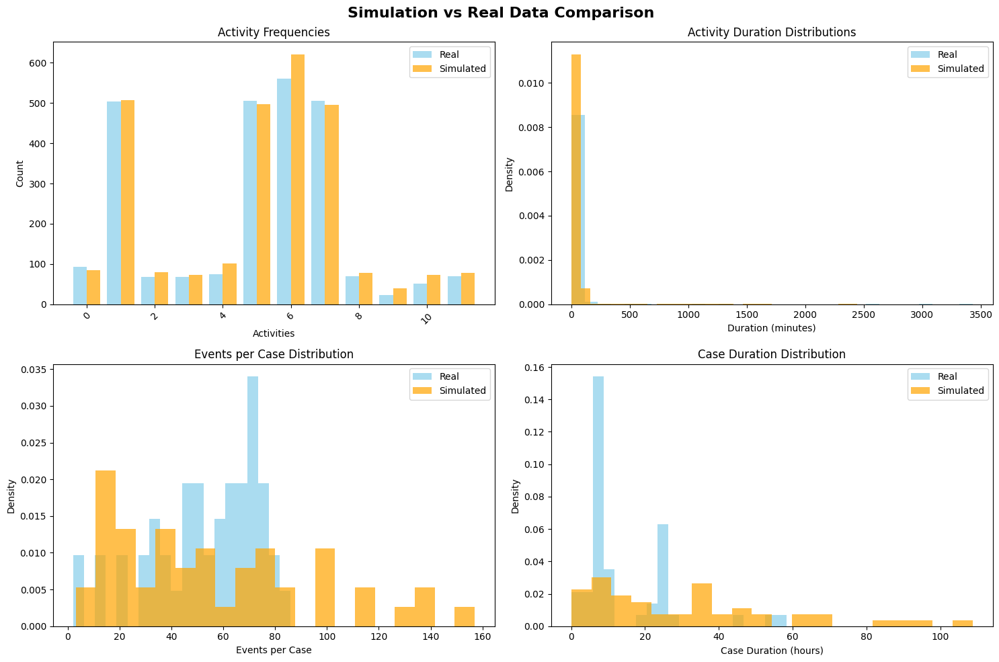


ANALYZING PROCESS_4

Processing: Erhitzer (heating_machine) - production
  Found 20 unique activities: ['Step-032 = Umlauf' 'Step-030 = Produktion' 'Step-035 = Ausschub Anlage'
 'Step-020 = Sterilwasserumlauf (über VLG)'
 'Step-024 = Sterilwasserumlauf, VLG Produktionsbereit'
 'Step-025 = Füllen Anlage' 'Step-046 = Anlage Abfahren'
 'Step-047 = Anlage Stop' 'Step-049 = CIP läuft' 'Step-002 = Start Weg'
 'Step-005 = Füllen Wasser' 'Step-010 = Aufheizen 1'
 'Step-011 = Aufheizen 2 (geschlossener Kreis)' 'Step-012 = Sterilisieren'
 'Step-014 = Temperaturausgleich 1 (geschlossener Kreis)'
 'Step-015 = Temperaturausgleich 2'
 'Step-021 = Sterilwasserumlauf, Produkt vorziehen'
 'Step-022 = Sterilwasserumlauf, VLG entleeren'
 'Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt'
 'Step-033 = Produkttausch']
    Step-032 = Umlauf:
      Events: 707, Start: True, Can End: True
      Total occurrences: 665
      Transitions: {'Step-030 = Produktion': 0.8766917293233083, 'Step-035 = Ausschub A

,activity,object,object_type,higher_level_activity,duration,duration_std,n_events,transition,is_start,is_end
0,Step-032 = Umlauf,Erhitzer,heating_machine,production,5.285926,6.213620,707,"{'Step-030 = Produktion': 0.8766917293233083, ...",True,True
1,Step-030 = Produktion,Erhitzer,heating_machine,production,22.428421,42.429253,682,"{'Step-032 = Umlauf': 0.9660743134087237, 'Ste...",True,True
2,Step-035 = Ausschub Anlage,Erhitzer,heating_machine,production,16.192500,3.461632,80,{'Step-020 = Sterilwasserumlauf (über VLG)': 0...,True,True
3,Step-020 = Sterilwasserumlauf (über VLG),Erhitzer,heating_machine,production,88.568849,179.227648,84,"{'Step-024 = Sterilwasserumlauf, VLG Produktio...",True,True
4,"Step-024 = Sterilwasserumlauf, VLG Produktions...",Erhitzer,heating_machine,production,0.764103,2.440887,78,{'Step-025 = Füllen Anlage': 0.985714285714285...,True,True
5,Step-025 = Füllen Anlage,Erhitzer,heating_machine,production,13.123629,1.942772,79,"{'Step-032 = Umlauf': 0.45714285714285713, 'St...",False,True
6,Step-046 = Anlage Abfahren,Erhitzer,heating_machine,production,2.260000,0.377234,5,{'Step-047 = Anlage Stop': 1.0},True,False
7,Step-047 = Anlage Stop,Erhitzer,heating_machine,production,0.666667,0.000000,5,"{'Step-049 = CIP läuft': 0.5, '__END__': 0.5}",False,True
8,Step-049 = CIP läuft,Erhitzer,heating_machine,production,105.741667,16.159245,4,{'__END__': 1.0},False,True
9,Step-002 = Start Weg,Erhitzer,heating_machine,production,0.170833,0.034359,4,{},False,False


Building config from 20 activities:
  Config: ('Step-032 = Umlauf', 'Erhitzer', 'heating_machine', 'production')
    Transitions: {'Step-030 = Produktion': 0.8766917293233083, 'Step-035 = Ausschub Anlage': 0.07067669172932331, 'Step-033 = Produkttausch': 0.019548872180451128, '__END__': 0.03308270676691729}
    Start: True
  Config: ('Step-030 = Produktion', 'Erhitzer', 'heating_machine', 'production')
    Transitions: {'Step-032 = Umlauf': 0.9660743134087237, 'Step-035 = Ausschub Anlage': 0.0210016155088853, '__END__': 0.012924071082390954}
    Start: True
  Config: ('Step-035 = Ausschub Anlage', 'Erhitzer', 'heating_machine', 'production')
    Transitions: {'Step-020 = Sterilwasserumlauf (über VLG)': 0.8611111111111112, '__END__': 0.1388888888888889}
    Start: True
  Config: ('Step-020 = Sterilwasserumlauf (über VLG)', 'Erhitzer', 'heating_machine', 'production')
    Transitions: {'Step-024 = Sterilwasserumlauf, VLG Produktionsbereit': 0.26153846153846155, 'Step-021 = Sterilwasserum

,case_id,activity,timestamp_start,timestamp_end,object,object_type,higher_level_activity,object_attributes
0,10705690.0,Step-030 = Produktion,2024-08-01 09:58:56.000000,2024-08-01 10:42:26.217900,Erhitzer,heating_machine,production,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE..."
1,10705690.0,Step-032 = Umlauf,2024-08-01 10:42:27.217900,2024-08-01 10:46:52.826176,Erhitzer,heating_machine,production,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE..."
2,10705690.0,Step-030 = Produktion,2024-08-01 10:46:53.826176,2024-08-01 10:59:23.434291,Erhitzer,heating_machine,production,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE..."
3,10705690.0,Step-032 = Umlauf,2024-08-01 10:59:24.434291,2024-08-01 11:03:14.299591,Erhitzer,heating_machine,production,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE..."
4,10705690.0,Step-030 = Produktion,2024-08-01 11:03:15.299591,2024-08-01 12:32:41.294054,Erhitzer,heating_machine,production,"{'attr_product': 'BF 1,00 GRTG Apfel trüb S DE..."
...,...,...,...,...,...,...,...,...
1527,10709875.0,Step-035 = Ausschub Anlage,2024-08-30 13:28:20.041124,2024-08-30 13:43:28.856901,Erhitzer,heating_machine,production,"{'attr_product': 'BF 0,75 GRSEN VanillaPassion..."
1528,10709875.0,Step-020 = Sterilwasserumlauf (über VLG),2024-08-30 13:43:29.856901,2024-08-30 16:12:07.087594,Erhitzer,heating_machine,production,"{'attr_product': 'BF 0,75 GRSEN VanillaPassion..."
1529,10709875.0,"Step-024 = Sterilwasserumlauf, VLG Produktions...",2024-08-30 16:12:08.087594,2024-08-30 16:13:40.235808,Erhitzer,heating_machine,production,"{'attr_product': 'BF 0,75 GRSEN VanillaPassion..."
1530,10709875.0,Step-025 = Füllen Anlage,2024-08-30 16:13:41.235808,2024-08-30 16:28:16.869604,Erhitzer,heating_machine,production,"{'attr_product': 'BF 0,75 GRSEN VanillaPassion..."


🔍 RUNNING COMPREHENSIVE SIMULATION EVALUATION
Based on process mining literature (Rozinat et al., van der Aalst et al., Burattin & Sperduti)
COMPREHENSIVE SIMULATION EVALUATION

1. BASIC PROCESS METRICS
----------------------------------------
Events - Real: 1935, Sim: 1532, Ratio: 0.792
Cases - Real: 53, Sim: 53, Ratio: 1.000

2. ACTIVITY FREQUENCY ANALYSIS
----------------------------------------
Activity Coverage - Real: 20, Sim: 13
Jensen-Shannon Divergence (activities): 0.0803 (0=perfect, 1=worst)
Mean Absolute Error (frequencies): 0.0032

3. DURATION ANALYSIS
----------------------------------------
Duration Statistics:
          Real  Simulated  Error
Mean    15.526     17.755  0.144
Median   4.217      6.518  0.546
Std     48.613     39.857  0.180

Kolmogorov-Smirnov Test: KS=0.1632, p-value=0.0000
(p > 0.05 suggests distributions are similar)

4. CASE-LEVEL ANALYSIS
----------------------------------------
Events per Case Statistics:
          Real  Simulated  Error
Mean    32

/Users/davidzapata/miniconda3/envs/htp/lib/python3.10/site-packages/pm4py/utils.py:253: UserWarning:

Some rows of the Pandas data frame have been removed because of empty case IDs, activity labels, or timestamps to ensure the correct functioning of PM4Py's algorithms.

/var/folders/j7/bzg541gd7dg10j_2qvx3s4j00000gn/T/ipykernel_36535/4099246876.py:279: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/var/folders/j7/bzg541gd7dg10j_2qvx3s4j00000gn/T/ipykernel_36535/4099246876.py:282: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=Fal

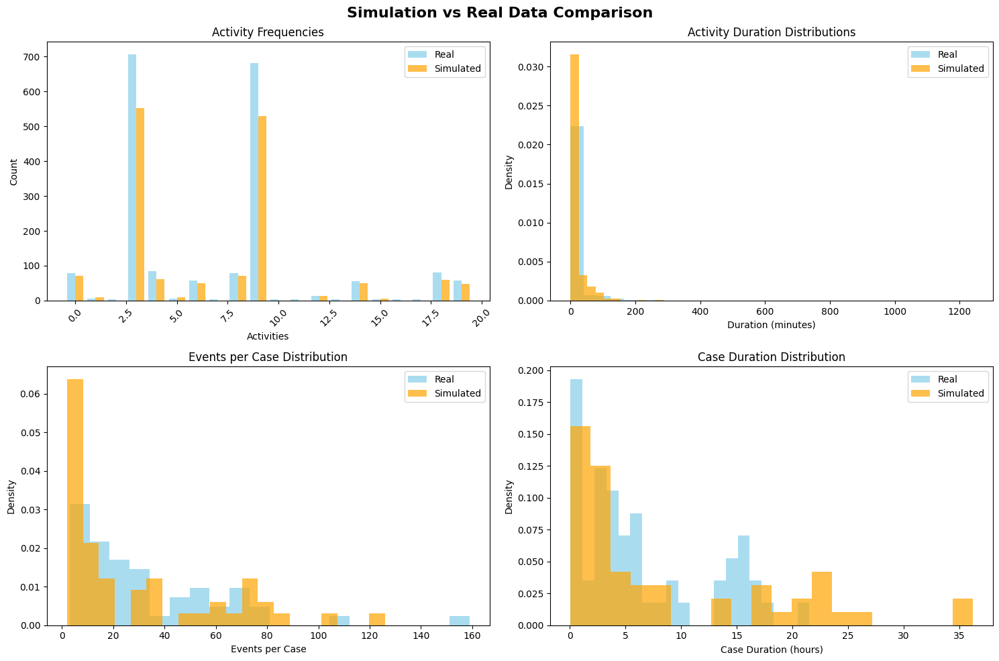


Aggregated Evaluation Results:


,process,overall_score,quality_assessment,basic_metrics_event_count_ratio,basic_metrics_case_count_ratio,basic_metrics_event_count_error,basic_metrics_case_count_error,activity_metrics_js_divergence,activity_metrics_frequency_mae,activity_metrics_activity_coverage_ratio,...,duration_metrics_std_duration_error,case_metrics_events_per_case_ks,case_metrics_events_per_case_pvalue,case_metrics_mean_events_per_case_error,case_metrics_median_events_per_case_error,control_flow_metrics_edge_precision,control_flow_metrics_edge_recall,control_flow_metrics_edge_f1_score,control_flow_metrics_start_activities_jaccard,control_flow_metrics_end_activities_jaccard
0,process_2,0.849707,EXCELLENT,1.053730,1.0,0.053730,0.0,0.037533,0.006624,1.00,...,0.004051,0.224490,0.169957,0.053730,0.263158,0.969697,0.653061,0.780488,0.833333,1.000000
1,process_4,0.874052,EXCELLENT,0.791731,1.0,0.208269,0.0,0.080258,0.003181,0.65,...,0.180118,0.207547,0.204835,0.113939,0.416667,1.000000,0.916667,0.956522,1.000000,0.888889


In [11]:
import pandas as pd
from sim_extractor import extract_process
from simulation import ProcessSimulation

# Initialize a list to store results for each process
evaluation_results_list = []

for process in process_datasets_to_model.keys():
    print("\n" + "="*80)
    print(f"ANALYZING {process.upper()}")
    print("="*80)

    df_event_log = process_datasets_to_model[process]['event_log']
    production_plan = process_datasets_to_model[process]['production_plan']

    activity_stats_df = extract_process(df_event_log)
    print("\n" + "="*50)
    print("PROBABILISTIC END ACTIVITY STATS:")
    print("="*50)
    display(activity_stats_df)

    # Drop rows where case_id is NaN (or missing)
    df_compare = df_event_log.dropna(subset=['case_id'])
    simulated_log = ProcessSimulation(activity_stats_df, production_plan).run()

    print("\n" + "="*50)
    print("Simulated log")
    display(simulated_log)

    # Run the comprehensive evaluation
    print("🔍 RUNNING COMPREHENSIVE SIMULATION EVALUATION")
    print("Based on process mining literature (Rozinat et al., van der Aalst et al., Burattin & Sperduti)")
    print("="*80)

    evaluation_results = comprehensive_simulation_evaluation(simulated_log, df_event_log)

    # Flatten the evaluation results and add the process name
    flattened_results = {'process': process}
    for category, metrics in evaluation_results.items():
        if isinstance(metrics, dict):
            for metric_name, value in metrics.items():
                flattened_results[f"{category}_{metric_name}"] = value
        else:
            flattened_results[category] = metrics

    # Append the flattened results to the list
    evaluation_results_list.append(flattened_results)

    print("\n📊 GENERATING COMPARISON PLOTS")
    plot_simulation_comparison(simulated_log, df_event_log)

# Convert the results list into a DataFrame
evaluation_results_df = pd.DataFrame(evaluation_results_list)

# Reorder columns to place overall_score and quality_assessment first
columns_order = ['process', 'overall_score', 'quality_assessment'] + \
                [col for col in evaluation_results_df.columns if col not in ['process', 'overall_score', 'quality_assessment']]
evaluation_results_df = evaluation_results_df[columns_order]

# Display the DataFrame
print("\nAggregated Evaluation Results:")
display(evaluation_results_df)

# Data fusion

In [12]:
# Modelling the curves

import pandas as pd
import numpy as np
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from dtw import dtw
from tslearn.barycenters import dtw_barycenter_averaging
import optuna
import matplotlib.pyplot as plt


# =============================================================================
# LEAKAGE AUDIT (confirmed clean)
# =============================================================================
# 1. split_curves      — split happens first; ngroup() is a pure index, not a
#                        learned statistic, so computing it pre-split is safe.
# 2. DBA barycenter    — computed from train_curves only.
# 3. DTW alignment     — applied to train_curves only.
# 4. _infer_key_types  — called on train_curves only; test curves use the
#                        resulting key_types dict at predict time.
# 5. get_dummies       — defined on training data; at predict time, test columns
#                        are aligned to feature_columns (missing → 0, extra → dropped).
#                        Val instances share training-level categories (correct).
# 6. predict_raw_curve — only the pipeline (fitted on train) is used; no test
#                        value influences any fitted statistic.
# =============================================================================


# =============================================================================
# STEP 1 — RAW SPLIT (before ANY preprocessing touches the data)
# =============================================================================

def split_curves(df_expanded, variable, activities, objects,
                 test_size=0.15, random_state=42, verbose=1):
    """
    Extract all activity curves and split into train/test sets.

    This is the very first operation. No DTW, no DBA, no normalisation —
    nothing touches the data before this split. Test curves are set aside as
    raw numpy arrays and never used again until final evaluation.

    Parameters
    ----------
    df_expanded  : pd.DataFrame
    variable     : str           — target energy column
    activities   : list[str]     — activity filter
    objects      : list[str]     — object_log filter
    test_size    : float         — fraction for test (default 0.15)
    random_state : int
    verbose      : int           — 0 = silent, 1 = full output

    Returns
    -------
    train_curves : list[dict]
    test_curves  : list[dict]
        Each dict: 'instance_id', 'activity', 'original_values' (np.ndarray),
                   'original_length', 'attributes'
    """
    if verbose:
        print("=" * 80)
        print("STEP 1 — RAW TRAIN/TEST SPLIT (before any preprocessing)")
        print("=" * 80)

    df = df_expanded.copy()
    df = df[['case_id_log', 'activity_log', 'object_log', 'timestamp_start_log',
             'datetime_energy', variable, 'object_attributes_log']]
    df = df[df['object_log'].isin(objects)]
    df = df[df['activity_log'].isin(activities)]
    df['timestamp_start'] = pd.to_datetime(df['timestamp_start_log'])
    df['datetime_energy'] = pd.to_datetime(df['datetime_energy'])
    df = df.sort_values(['case_id_log', 'timestamp_start_log', 'datetime_energy'])

    # ngroup() assigns a pure integer index — no statistic is learned here,
    # so computing it on the full (pre-split) df is safe.
    df['activity_instance_id'] = (
        df.groupby(['case_id_log', 'object_log', 'activity_log',
                    'timestamp_start_log']).ngroup()
    )

    curves_data = []
    for instance_id, group in df.groupby('activity_instance_id'):
        group  = group.sort_values('datetime_energy').reset_index(drop=True)
        values = group[variable].dropna().values
        if len(values) >= 5:
            attributes = (
                group['object_attributes_log'].iloc[0]
                if not group['object_attributes_log'].empty else {}
            )
            curves_data.append({
                'instance_id':     instance_id,
                'activity':        group['activity_log'].iloc[0],
                'original_values': values,
                'original_length': len(values),
                'attributes':      attributes,
            })

    if verbose:
        print(f"Total curves extracted : {len(curves_data)}")

    all_ids = list(range(len(curves_data)))
    train_ids, test_ids = train_test_split(
        all_ids, test_size=test_size, random_state=random_state
    )
    train_curves = [curves_data[i] for i in train_ids]
    test_curves  = [curves_data[i] for i in test_ids]

    if verbose:
        print(f"Train curves : {len(train_curves)}")
        print(f"Test curves  : {len(test_curves)}  <- set aside, never touched until evaluation")

    return train_curves, test_curves


# =============================================================================
# STEP 1b — VISUALISE RAW TRAINING CURVES (verbose=1 only, before DTW/DBA)
# =============================================================================

def plot_training_curves(train_curves, n_plot=12, figsize_per_row=(14, 2.5), verbose=1):
    """
    Plot a sample of raw training curves BEFORE any DTW/DBA transformation.
    Call this after split_curves() and before build_and_train_pipeline().

    Parameters
    ----------
    train_curves    : list[dict]  — from split_curves()
    n_plot          : int         — how many curves to show (default 12)
    figsize_per_row : tuple       — (width, height) per subplot row
    verbose         : int         — if 0, does nothing
    """
    if not verbose:
        return

    n_plot = min(n_plot, len(train_curves))
    n_cols = 3
    n_rows = int(np.ceil(n_plot / n_cols))
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(figsize_per_row[0], figsize_per_row[1] * n_rows)
    )
    axes = np.array(axes).flatten()

    # Sample evenly across the full training set for a representative overview
    indices = np.linspace(0, len(train_curves) - 1, n_plot, dtype=int)

    for ax, idx in zip(axes[:n_plot], indices):
        curve = train_curves[idx]
        ax.plot(curve['original_values'], color='steelblue', linewidth=1.5)
        ax.set_title(
            f"id={curve['instance_id']} | {curve['activity']}\n"
            f"len={curve['original_length']}",
            fontsize=8
        )
        ax.set_xlabel("Time step", fontsize=7)
        ax.set_ylabel("Energy",    fontsize=7)
        ax.tick_params(labelsize=7)
        ax.grid(True, alpha=0.3)

    for ax in axes[n_plot:]:
        ax.set_visible(False)

    plt.suptitle(
        f"Raw Training Curves — BEFORE DTW/DBA  "
        f"(showing {n_plot} of {len(train_curves)})",
        fontsize=11, fontweight='bold', y=1.01
    )
    plt.tight_layout()
    plt.show()


# =============================================================================
# INTERNAL HELPERS
# =============================================================================

def _align_curve_with_dtw(query, reference):
    """DTW-align a single query curve onto the reference grid (train only)."""
    alignment = dtw(query, reference, keep_internals=True)
    aligned = np.zeros(len(reference))
    counts  = np.zeros(len(reference))
    for qi, ri in zip(alignment.index1, alignment.index2):
        aligned[ri] += query[qi]
        counts[ri]  += 1
    counts  = np.where(counts == 0, 1, counts)
    aligned /= counts
    return aligned


def _infer_key_types(curves):
    """
    Determine numeric vs categorical for each attribute key.
    Always called only on train_curves — key_types is stored in the pipeline
    and reused at predict time without touching test data.
    """
    all_keys = sorted({k for c in curves for k in c['attributes'].keys()})
    key_types = {}
    for key in all_keys:
        is_numeric = True
        for curve in curves:
            if key in curve['attributes']:
                try:
                    float(curve['attributes'][key])
                except (ValueError, TypeError):
                    is_numeric = False
                    break
        key_types[key] = 'numeric' if is_numeric else 'category'
    return all_keys, key_types


def _build_feature_matrix(curves, all_keys, key_types, fixed_length,
                           value_key='resampled_values', include_target=True):
    """
    Flatten DTW-aligned train curves into a regression dataset.
    Each curve contributes `fixed_length` rows (one per barycenter position).
    Only ever called on train_curves.
    """
    rows = []
    for curve in curves:
        for position_idx in range(fixed_length):
            row = {
                'instance_id':       curve['instance_id'],
                'activity':          curve['activity'],
                'position_idx':      position_idx,
                'curve_length':      curve['original_length'],
            }
            if include_target:
                row['y'] = curve[value_key][position_idx]

            for key in all_keys:
                value = curve['attributes'].get(key, None)
                if key_types[key] == 'numeric':
                    try:
                        row[key] = float(value) if value is not None else np.nan
                    except (ValueError, TypeError):
                        row[key] = np.nan
                else:
                    row[key] = str(value) if value is not None else 'None'
            rows.append(row)

    return pd.DataFrame(rows)


# =============================================================================
# STEP 2 — BUILD + TRAIN PIPELINE  (train curves only)
# =============================================================================

def build_and_train_pipeline(
    train_curves,
    variable,
    fixed_length=100,
    val_size=0.2,
    random_state=42,
    models=None,
    optimize_hyperparams=False,
    n_trials=50,
    verbose=1,
):
    """
    Build the full preprocessing + training pipeline using ONLY train curves.

    Stages
    ------
    2a. DBA barycenter  — computed from train curves only
    2b. DTW alignment   — aligns each train curve to the barycenter
    2c. Feature matrix  — position + attribute features (train only)
    2d. Model training  — val split is done by instance_id (no leakage)
    2e. Best model      — selected by validation R2

    Parameters
    ----------
    train_curves         : list[dict]  — from split_curves()
    variable             : str         — informational label only
    fixed_length         : int         — DBA barycenter length
    val_size             : float       — fraction of train instances for val
    random_state         : int
    models               : dict        — {name: ModelClass}
    optimize_hyperparams : bool
    n_trials             : int
    verbose              : int         — 0 = silent, 1 = full output

    Returns
    -------
    pipeline : dict
        'model'            — best trained sklearn model
        'model_name'       — str
        'reference_curve'  — DBA barycenter (np.ndarray, length=fixed_length)
        'fixed_length'     — int
        'all_keys'         — attribute key names (inferred from train only)
        'key_types'        — {key: 'numeric'|'category'} (from train only)
        'feature_columns'  — exact column order the model expects
        'val_r2'           — float
        'all_results'      — dict with train/val metrics per model
    """
    if verbose:
        print("\n" + "=" * 80)
        print("STEP 2 — BUILD + TRAIN PIPELINE  (train curves only)")
        print("=" * 80)

    if models is None:
        models = {
            'Gradient Boosting': GradientBoostingRegressor,
            'Random Forest':     RandomForestRegressor,
        }

    # ------------------------------------------------------------------
    # 2a. DBA barycenter — train curves only
    # ------------------------------------------------------------------
    if verbose:
        print(f"\n[2a] Computing DBA barycenter from {len(train_curves)} train curves "
              f"(fixed_length={fixed_length})...")

    resampled_for_dba = np.array([
        np.interp(
            np.linspace(0, 1, fixed_length),
            np.linspace(0, 1, len(c['original_values'])),
            c['original_values']
        )
        for c in train_curves
    ])[:, :, np.newaxis]

    dba_barycenter  = dtw_barycenter_averaging(resampled_for_dba, barycenter_size=fixed_length)
    reference_curve = dba_barycenter[:, 0]

    if verbose:
        print(f"    Barycenter length: {len(reference_curve)} points")

    # ------------------------------------------------------------------
    # 2b. DTW-align train curves to barycenter  (test curves never touched)
    # ------------------------------------------------------------------
    if verbose:
        print(f"\n[2b] Aligning {len(train_curves)} train curves to DBA barycenter...")

    for i, curve in enumerate(train_curves):
        if verbose and i % max(1, len(train_curves) // 10) == 0:
            print(f"    Curve {i + 1}/{len(train_curves)}...")
        curve['resampled_values'] = _align_curve_with_dtw(
            curve['original_values'], reference_curve
        )

    # ------------------------------------------------------------------
    # 2c. Attribute types (train only) + feature matrix (train only)
    # ------------------------------------------------------------------
    all_keys, key_types = _infer_key_types(train_curves)

    if verbose:
        print(f"\n[2c] Attribute columns: {key_types}")

    df_reg = _build_feature_matrix(
        train_curves, all_keys, key_types, fixed_length,
        value_key='resampled_values', include_target=True
    )

    if verbose:
        print(f"     Regression dataset: {len(df_reg)} rows "
              f"({len(train_curves)} curves x {fixed_length} positions)")

    # Dummies defined on training data only. Val instances are a subset of
    # train curves so they share the same category levels — no unseen levels
    # can appear in the val set.
    categorical_cols = ['activity'] + [k for k in all_keys if key_types[k] == 'category']
    X_all = df_reg[['position_idx', 'curve_length']].copy()
    X_all = X_all.assign(activity=df_reg['activity'].values)
    for key in all_keys:
        X_all = X_all.assign(**{key: df_reg[key].values})
    X_all = pd.get_dummies(X_all, columns=categorical_cols, drop_first=True)
    y_all = df_reg['y'].copy()

    # Val split by instance_id: an entire curve is either train or val —
    # no point-level leakage between the two sets is possible.
    unique_instances     = df_reg['instance_id'].unique()
    train_inst, val_inst = train_test_split(
        unique_instances, test_size=val_size, random_state=random_state
    )
    train_mask = df_reg['instance_id'].isin(train_inst)
    val_mask   = df_reg['instance_id'].isin(val_inst)

    X_train, X_val = X_all[train_mask].copy(), X_all[val_mask].copy()
    y_train, y_val = y_all[train_mask].copy(), y_all[val_mask].copy()

    feature_columns = X_all.columns.tolist()

    if verbose:
        print(f"\n     Train: {len(train_inst)} curves / {len(X_train)} points")
        print(f"     Val  : {len(val_inst)} curves / {len(X_val)} points")

    # ------------------------------------------------------------------
    # 2d. Train models
    # ------------------------------------------------------------------
    all_results = {}

    for name, model_class in models.items():
        if verbose:
            print(f"\n[2d] Training — {name}...")

        if optimize_hyperparams:
            if not verbose:
                optuna.logging.set_verbosity(optuna.logging.WARNING)

            def objective(trial, name=name, model_class=model_class):
                if name == 'Gradient Boosting':
                    params = {
                        'n_estimators':  trial.suggest_int('n_estimators', 50, 300),
                        'max_depth':     trial.suggest_int('max_depth', 3, 10),
                        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
                        'subsample':     trial.suggest_float('subsample', 0.5, 1.0),
                        'random_state':  random_state,
                    }
                elif name == 'Random Forest':
                    params = {
                        'n_estimators':      trial.suggest_int('n_estimators', 50, 300),
                        'max_depth':         trial.suggest_int('max_depth', 5, 20),
                        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
                        'random_state':      random_state,
                        'n_jobs':            -1,
                    }
                else:
                    params = {}
                m = model_class(**params)
                m.fit(X_train, y_train)
                return r2_score(y_val, m.predict(X_val))

            study = optuna.create_study(direction='maximize')
            study.optimize(objective, n_trials=n_trials)
            best_params = study.best_params
            if name in ('Gradient Boosting', 'Random Forest'):
                best_params['random_state'] = random_state
            if name == 'Random Forest':
                best_params['n_jobs'] = -1
            if verbose:
                print(f"     Best params: {best_params}")
            model = model_class(**best_params)

        else:
            if name == 'Gradient Boosting':
                model = model_class(
                    n_estimators=200, max_depth=7, learning_rate=0.1,
                    subsample=0.8, random_state=random_state
                )
            elif name == 'Random Forest':
                model = model_class(
                    n_estimators=200, max_depth=12, min_samples_split=5,
                    random_state=random_state, n_jobs=-1
                )
            else:
                try:
                    model = model_class(random_state=random_state)
                except TypeError:
                    model = model_class()

        model.fit(X_train, y_train)

        train_pred = model.predict(X_train)
        val_pred   = model.predict(X_val)
        train_r2   = r2_score(y_train, train_pred)
        val_r2     = r2_score(y_val,   val_pred)
        train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
        val_rmse   = np.sqrt(mean_squared_error(y_val,   val_pred))

        if verbose:
            print(f"     Train  R2={train_r2:.4f}  RMSE={train_rmse:.4f}")
            print(f"     Val    R2={val_r2:.4f}  RMSE={val_rmse:.4f}")

        all_results[name] = {
            'model':      model,
            'train_r2':   train_r2,
            'val_r2':     val_r2,
            'train_rmse': train_rmse,
            'val_rmse':   val_rmse,
        }

    # ------------------------------------------------------------------
    # 2e. Select best model by val R2
    # ------------------------------------------------------------------
    best_name  = max(all_results, key=lambda k: all_results[k]['val_r2'])
    best_model = all_results[best_name]['model']

    if verbose:
        print(f"\n Best model : {best_name}  "
              f"(val R2={all_results[best_name]['val_r2']:.4f})")

    pipeline = {
        'model':           best_model,
        'model_name':      best_name,
        'reference_curve': reference_curve,
        'fixed_length':    fixed_length,
        'all_keys':        all_keys,
        'key_types':       key_types,
        'feature_columns': feature_columns,
        'val_r2':          all_results[best_name]['val_r2'],
        'all_results':     all_results,
    }

    return pipeline


# =============================================================================
# STEP 3 — PREDICT ON A SINGLE RAW CURVE
# =============================================================================

def predict_raw_curve(raw_values, activity, attributes, pipeline):
    """
    Predict energy for a single raw, unseen curve using the trained pipeline.

    Steps
    -----
    1. DTW the raw curve to reference_curve (train barycenter) to get a
       position mapping. Only the pipeline's reference_curve is used —
       no test statistics are computed.
    2. For each raw time step, look up its mapped barycenter position and
       build a feature row using pipeline's all_keys / key_types (train-derived).
    3. One-hot encode, then align columns to feature_columns:
         - missing columns (unseen category levels) -> filled with 0
         - extra columns (unseen test-only levels)  -> dropped
    4. model.predict() returns values in original energy units because the
       model was trained on DTW-aligned curves that preserve the original scale.

    Parameters
    ----------
    raw_values  : np.ndarray  — original, unwarped energy curve
    activity    : str
    attributes  : dict
    pipeline    : dict        — from build_and_train_pipeline()

    Returns
    -------
    y_pred : np.ndarray  shape (len(raw_values),), original energy units
    """
    reference_curve = pipeline['reference_curve']
    fixed_length    = pipeline['fixed_length']
    model           = pipeline['model']
    feature_columns = pipeline['feature_columns']
    all_keys        = pipeline['all_keys']
    key_types       = pipeline['key_types']

    alignment = dtw(raw_values, reference_curve, keep_internals=True)
    raw_to_ref_pos = {}
    for qi, ri in zip(alignment.index1, alignment.index2):
        if qi not in raw_to_ref_pos:
            raw_to_ref_pos[qi] = ri

    rows = []
    for raw_idx in range(len(raw_values)):
        ref_pos = raw_to_ref_pos.get(raw_idx, raw_idx)
        ref_pos = min(ref_pos, fixed_length - 1)

        row = {
            'position_idx':      ref_pos,
            'curve_length':      len(raw_values),
            'activity':          activity,
        }
        for key in all_keys:
            value = attributes.get(key, None)
            if key_types[key] == 'numeric':
                try:
                    row[key] = float(value) if value is not None else np.nan
                except (ValueError, TypeError):
                    row[key] = np.nan
            else:
                row[key] = str(value) if value is not None else 'None'
        rows.append(row)

    X_raw = pd.DataFrame(rows)

    categorical_cols = ['activity'] + [k for k in all_keys if key_types[k] == 'category']
    X_raw = pd.get_dummies(X_raw, columns=categorical_cols, drop_first=True)

    for col in feature_columns:
        if col not in X_raw.columns:
            X_raw[col] = 0
    X_raw = X_raw[feature_columns]

    return model.predict(X_raw)


# =============================================================================
# STEP 4 — EVALUATE ON RAW TEST CURVES
# =============================================================================

def evaluate_pipeline_on_test(test_curves, pipeline, max_plot_curves=6, verbose=1):
    """
    Evaluate the trained pipeline on completely unseen, raw test curves.
    Ground truth = raw_values (never warped, never seen during training).
    Predictions  = predict_raw_curve() output (original energy units).

    Plots are shown in a grid with 3 columns and as many rows as necessary.
    """

    if verbose:
        print("\n" + "=" * 80)
        print("STEP 4 — EVALUATION ON RAW TEST CURVES")
        print("  Ground truth : raw_values — never warped, never seen in training")
        print("  Predictions  : original energy units (DTW for positioning only)")
        print("=" * 80)

    per_curve_metrics = []
    all_true, all_pred = [], []

    for curve in test_curves:
        raw_values = curve['original_values']
        y_pred = predict_raw_curve(
            raw_values, curve['activity'], curve['attributes'], pipeline
        )

        mae  = mean_absolute_error(raw_values, y_pred)
        rmse = np.sqrt(mean_squared_error(raw_values, y_pred))
        r2   = r2_score(raw_values, y_pred)
        wape = np.sum(np.abs(raw_values - y_pred)) / np.sum(np.abs(raw_values)) * 100

        per_curve_metrics.append({
            'instance_id': curve['instance_id'],
            'activity':    curve['activity'],
            'n_points':    len(raw_values),
            'MAE':         mae,
            'RMSE':        rmse,
            'WAPE (%)':    wape,
            'R2':          r2,
        })

        all_true.extend(raw_values.tolist())
        all_pred.extend(y_pred.tolist())

    # Aggregate metrics
    all_true = np.array(all_true)
    all_pred = np.array(all_pred)

    agg_metrics = {
        'MAE':      mean_absolute_error(all_true, all_pred),
        'RMSE':     np.sqrt(mean_squared_error(all_true, all_pred)),
        'WAPE (%)': np.sum(np.abs(all_true - all_pred)) / np.sum(np.abs(all_true)) * 100,
        'R2':       r2_score(all_true, all_pred),
    }

    metrics_df = pd.DataFrame(per_curve_metrics)

    if verbose:
        print("\nPer-curve metrics:")
        print(metrics_df.to_string(index=False, float_format='%.4f'))

    print("\nAggregate metrics across all test curves:")
    for k, v in agg_metrics.items():
        print(f"  {k:12s}: {v:.4f}")

    # ------------------------------------------------------------------
    # GRID PLOTTING (3 columns)
    # ------------------------------------------------------------------
    if verbose:
        n_plot = min(max_plot_curves, len(test_curves))

        n_cols = 3
        n_rows = int(np.ceil(n_plot / n_cols))

        fig, axes = plt.subplots(
            n_rows, n_cols,
            figsize=(14, 3.5 * n_rows)
        )

        axes = np.array(axes).reshape(-1)  # flatten safely

        for ax, curve in zip(axes[:n_plot], test_curves[:n_plot]):
            raw_values = curve['original_values']
            y_pred = predict_raw_curve(
                raw_values, curve['activity'], curve['attributes'], pipeline
            )

            r2_val   = r2_score(raw_values, y_pred)
            rmse_val = np.sqrt(mean_squared_error(raw_values, y_pred))

            ax.plot(raw_values, label='Actual (raw)', color='steelblue', linewidth=2)
            ax.plot(y_pred, label='Predicted', color='tomato',
                    linewidth=2, linestyle='--')

            ax.set_title(
                f"ID {curve['instance_id']} | {curve['activity']}\n"
                f"R2={r2_val:.3f}  RMSE={rmse_val:.4f}",
                fontsize=9
            )
            ax.set_xlabel("Time step")
            ax.set_ylabel("Energy")
            ax.grid(True, alpha=0.3)
            ax.legend(fontsize=8)

        # Hide unused subplots
        for ax in axes[n_plot:]:
            ax.set_visible(False)

        plt.suptitle(
            "Test Evaluation: Raw Predicted vs Raw Actual (original energy units)",
            fontsize=14, fontweight='bold', y=1.02
        )
        plt.tight_layout()
        plt.show()

    return metrics_df, agg_metrics

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



/Users/davidzapata/miniconda3/envs/htp/lib/python3.10/site-packages/tslearn/bases/bases.py:16: UserWarning:

h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/

/Users/davidzapata/miniconda3/envs/htp/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



In [13]:
process_datasets_to_model['process_2']['expanded']

,datetime_energy,medium_power_kW_energy,pro_temp_out_energy,pro_power_kW_energy,status_name_energy,pro_volstrom_l/h_energy,cip_turm_g_energy,pro_menge_kg_energy,dampfmenge_kg/h_nmb+cip_energy,cip_turm_f_energy,timestamp_start_log,timestamp_end_log,activity_log,higher_level_activity_log,object_type_log,object_log,case_id_log,object_attributes_log
0,2024-11-03 14:03:21,334.834330,31.201172,0.0,Grundstellung,0.0,0,0.0,574.001709,0,2024-11-03 14:03:21,2024-11-04 08:58:21,Grundstellung,shift,production_line,l01,shift_2_2024-11-03,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
1,2024-11-03 14:03:26,310.992966,31.201172,0.0,Grundstellung,0.0,0,0.0,533.130798,0,2024-11-03 14:03:21,2024-11-04 08:58:21,Grundstellung,shift,production_line,l01,shift_2_2024-11-03,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
2,2024-11-03 14:03:31,290.316355,31.201172,0.0,Grundstellung,0.0,0,0.0,497.685181,0,2024-11-03 14:03:21,2024-11-04 08:58:21,Grundstellung,shift,production_line,l01,shift_2_2024-11-03,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
3,2024-11-03 14:03:36,283.142840,31.201172,0.0,Grundstellung,0.0,0,0.0,485.387726,0,2024-11-03 14:03:21,2024-11-04 08:58:21,Grundstellung,shift,production_line,l01,shift_2_2024-11-03,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
4,2024-11-03 14:03:41,290.738332,31.195747,0.0,Grundstellung,0.0,0,0.0,498.408569,0,2024-11-03 14:03:21,2024-11-04 08:58:21,Grundstellung,shift,production_line,l01,shift_2_2024-11-03,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736981,2024-11-24 22:10:16,2.320843,26.844618,0.0,Grundstellung,0.0,30,0.0,3.978588,0,2024-11-22 19:47:01,2024-11-24 22:10:36,Grundstellung,shift,production_line,l02,shift_2_2024-11-22,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
736982,2024-11-24 22:10:21,0.000000,26.844618,0.0,Grundstellung,0.0,30,0.0,0.000000,0,2024-11-22 19:47:01,2024-11-24 22:10:36,Grundstellung,shift,production_line,l02,shift_2_2024-11-22,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
736983,2024-11-24 22:10:26,0.000000,26.844618,0.0,Grundstellung,0.0,30,0.0,0.000000,0,2024-11-22 19:47:01,2024-11-24 22:10:36,Grundstellung,shift,production_line,l02,shift_2_2024-11-22,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
736984,2024-11-24 22:10:31,0.000000,26.833767,0.0,Grundstellung,0.0,30,0.0,0.000000,0,2024-11-22 19:47:01,2024-11-24 22:10:36,Grundstellung,shift,production_line,l02,shift_2_2024-11-22,"{'mat_id_m03_': 0, 'mat_id_m02_': 0, 'mat_id_m..."


Activities: ['Step-032 = Umlauf', 'Step-030 = Produktion']
Energy variables: ['temp_Auslauf_EG_(WT2)_5s_energy', 'temp_Einlauf_EG_(WT_2)_5s_energy', 'flow_Kuehlturmwasser_30120FT701_5s_energy', 'flow_Kaltwasser_(WT7)_5s_energy', 'Kuehlturmwassertemp_(WT6)_5s_energy', 'Kaltwassertemp_(WT_7)_5s_energy', 'nach_Kuehler_(WT7)_5s_energy', 'temp_nach_Kuehlturmkuehler_(WT6)_5s_energy', 'Fuellstand_Steriltank_30140LT001_5s_energy', 'Fuellstand_Steriltank_30141LT001_5s_energy', 'flow_Dampf_WT3a/5a)_5s_energy', 'flow_Heisswasser_30120FT721(WT5a)_5s_energy', 'temp_nach_WR2,_vor_Druckerhoehungspumpe_(WT4)_5s_energy', 'temp_nach_Erhitzer_(WT5)_5s_energy', 'temp_nach_WR2_(WT2)_5s_energy', 'temp_nach_Austauscher_2_(WT4)_5s_energy', 'Druck_HW_Anwaermer_(WT3a)_5s_energy', 'temp_HW_Anwaermer_(WT3a)_5s_energy', 'temp_Produkt_Einlauf_30110TT001_1h_energy', 'flow_Vorlaufpumpe_30110FT301_1h_energy', 'temp_vor_Vorwärmer_(WT_2)_1h_energy', 'strom_PERT2_KZE_5s_energy', 'dampf_PET2_KZE_5s_energy', 'strom_gesamt_

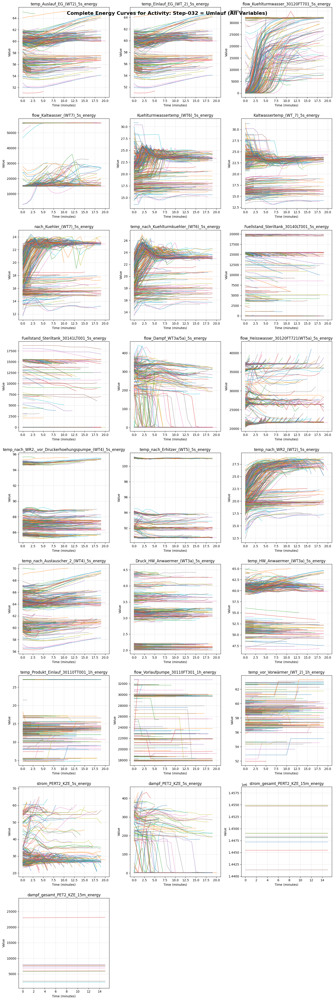


Processing activity: Step-030 = Produktion
Total number of instances for Step-030 = Produktion: 461
  temp_Auslauf_EG_(WT2)_5s_energy: 461 instances have data (out of 461)
  Number of curves plotted for temp_Auslauf_EG_(WT2)_5s_energy: 461
  temp_Einlauf_EG_(WT_2)_5s_energy: 461 instances have data (out of 461)
  Number of curves plotted for temp_Einlauf_EG_(WT_2)_5s_energy: 461
  flow_Kuehlturmwasser_30120FT701_5s_energy: 461 instances have data (out of 461)
  Number of curves plotted for flow_Kuehlturmwasser_30120FT701_5s_energy: 461
  flow_Kaltwasser_(WT7)_5s_energy: 461 instances have data (out of 461)
  Number of curves plotted for flow_Kaltwasser_(WT7)_5s_energy: 461
  Kuehlturmwassertemp_(WT6)_5s_energy: 461 instances have data (out of 461)
  Number of curves plotted for Kuehlturmwassertemp_(WT6)_5s_energy: 461
  Kaltwassertemp_(WT_7)_5s_energy: 461 instances have data (out of 461)
  Number of curves plotted for Kaltwassertemp_(WT_7)_5s_energy: 461
  nach_Kuehler_(WT7)_5s_energ

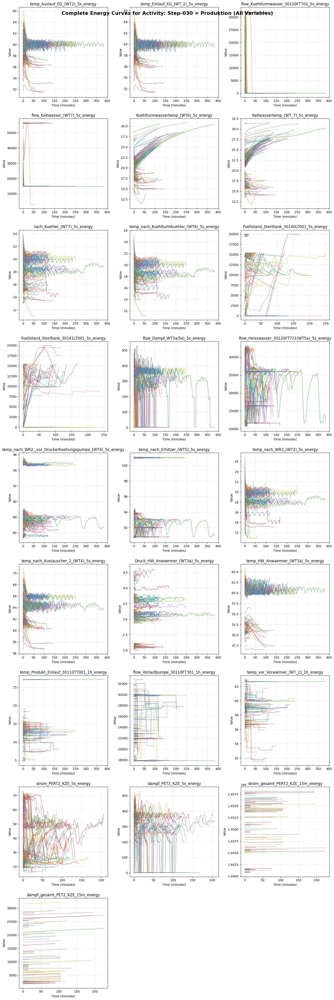

In [26]:
import matplotlib.pyplot as plt
import numpy as np

# Define activities
activities = ['Step-032 = Umlauf', 'Step-030 = Produktion']

df_expanded = process_datasets_to_model_sensors['process_4']['expanded']

# Get all energy columns (excluding datetime_energy)
energy_cols = [col for col in df_expanded.columns if col.endswith('_energy') and col != 'datetime_energy']

print(f"Activities: {activities}")
print(f"Energy variables: {energy_cols}")

for activity in activities:
    print(f"\nProcessing activity: {activity}")
    
    # Filter for this activity
    df_act = df_expanded[df_expanded['activity_log'] == activity].copy()
    
    # Create activity_instance_id
    df_act['activity_instance_id'] = df_act.groupby(['case_id_log', 'activity_log', 'timestamp_start_log']).ngroup()
    
    # Calculate total number of instances for this activity
    total_instances = df_act['activity_instance_id'].nunique()
    print(f"Total number of instances for {activity}: {total_instances}")
    
    # Calculate number of subplots
    n_vars = len(energy_cols)
    n_cols = 3  # Adjust columns per row
    n_rows = (n_vars + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
    # Ensure axes is always a flat array
    axes = np.array(axes).flatten()
    
    for i, variable in enumerate(energy_cols):
        if i >= len(axes):
            break  # Safety check
        ax = axes[i]
        
        # Count instances with data for this variable
        instances_with_data = 0
        for instance_id in df_act['activity_instance_id'].unique():
            instance_data = df_act[df_act['activity_instance_id'] == instance_id]
            if instance_data[variable].notna().any():  # At least one non-NaN value
                instances_with_data += 1
        
        print(f"  {variable}: {instances_with_data} instances have data (out of {total_instances})")
        
        # Collect and plot curves for this variable
        curve_count = 0
        for instance_id, group in df_act.groupby('activity_instance_id'):
            group = group.sort_values('datetime_energy')
            # Drop rows where either datetime_energy or variable is NaN
            group = group.dropna(subset=['datetime_energy', variable])
            values = group[variable].values
            times = group['datetime_energy']
            
            if len(values) >= 1 and len(times) >= 1:  # Include curves with at least 1 point
                # Calculate time elapsed in minutes from the start of this instance
                time_elapsed = (times - times.min()).dt.total_seconds() / 60
                
                # Plot the curve
                ax.plot(time_elapsed, values, alpha=0.7, linewidth=1, label=f'Instance {instance_id}')
                curve_count += 1
        
        print(f"  Number of curves plotted for {variable}: {curve_count}")
        
        if curve_count == 0:
            ax.text(0.5, 0.5, f'No valid curves for {variable}', 
                    ha='center', va='center', transform=ax.transAxes)
        
        ax.set_title(f'{variable}')
        ax.set_xlabel('Time (minutes)')
        ax.set_ylabel('Value')
        ax.grid(True, alpha=0.3)
        
        # If too many curves, don't show legend to avoid clutter
        if curve_count > 10:
            ax.legend().set_visible(False)
        elif curve_count > 0:
            ax.legend(fontsize=6, loc='best')
    
    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)
    
    plt.suptitle(f'Complete Energy Curves for Activity: {activity} (All Variables)', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

In [28]:
process_datasets_to_model_sensors = process_datasets_to_model.copy()

process_datasets_to_model_sensors['process_4']['objects_to_model'] = ['Erhitzer']
process_datasets_to_model_sensors['process_4']['activities_to_model'] = ['Step-032 = Umlauf', 'Step-030 = Produktion']
process_datasets_to_model_sensors['process_4']['activities_to_model'] = ['Step-032 = Umlauf']
process_datasets_to_model_sensors['process_4']['sensors_to_model'] = ['temp_nach_WR2_(WT2)_5s_energy']

process_datasets_to_model_sensors['process_2']['objects_to_model'] = ['l01']
process_datasets_to_model_sensors['process_2']['activities_to_model'] = ['Produktion']
process_datasets_to_model_sensors['process_2']['sensors_to_model'] = ['pro_volstrom_l/h_energy']



In [29]:
df_expanded['object_log']

0        Erhitzer
1        Erhitzer
2        Erhitzer
3        Erhitzer
4        Erhitzer
           ...   
30037    Erhitzer
30038    Erhitzer
30039    Erhitzer
30040    Erhitzer
30041    Erhitzer
Name: object_log, Length: 30042, dtype: object

STEP 1 — RAW TRAIN/TEST SPLIT (before any preprocessing)
Total curves extracted : 252
Train curves : 214
Test curves  : 38  <- set aside, never touched until evaluation


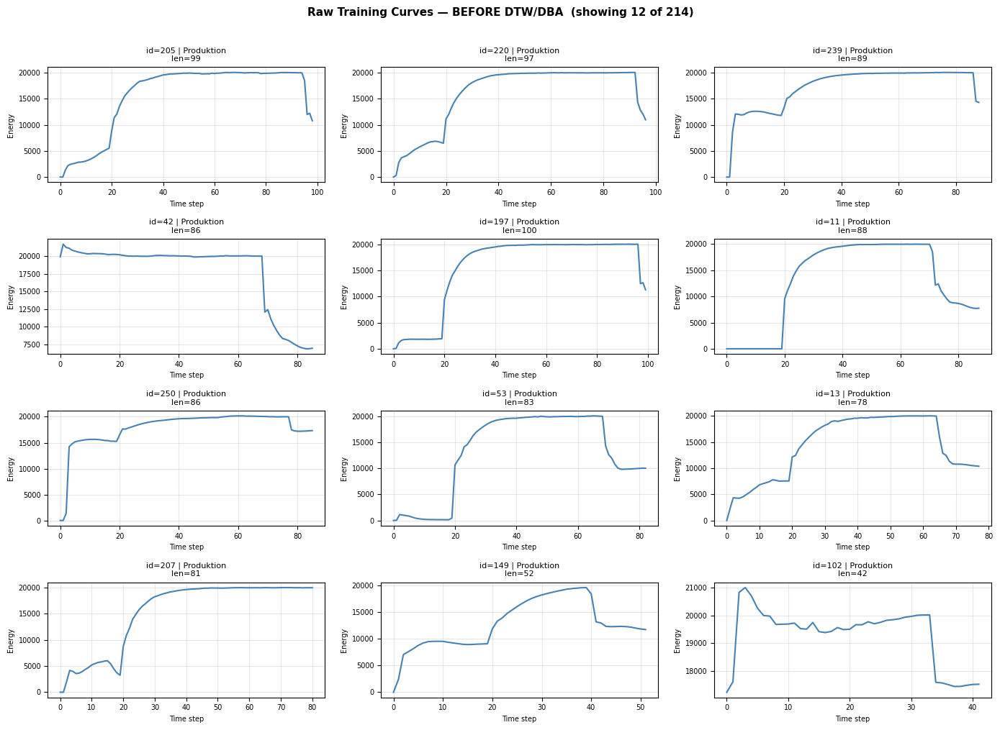


STEP 2 — BUILD + TRAIN PIPELINE  (train curves only)

[2a] Computing DBA barycenter from 214 train curves (fixed_length=100)...
    Barycenter length: 100 points

[2b] Aligning 214 train curves to DBA barycenter...
    Curve 1/214...
    Curve 22/214...
    Curve 43/214...
    Curve 64/214...
    Curve 85/214...
    Curve 106/214...
    Curve 127/214...
    Curve 148/214...
    Curve 169/214...
    Curve 190/214...
    Curve 211/214...

[2c] Attribute columns: {'mat_id_m01_': 'numeric', 'mat_id_m02_': 'numeric', 'mat_id_m03_': 'numeric'}
     Regression dataset: 21400 rows (214 curves x 100 positions)

     Train: 171 curves / 17100 points
     Val  : 43 curves / 4300 points

[2d] Training — Linear Regression...
     Train  R2=0.1042  RMSE=2377.7461
     Val    R2=0.0947  RMSE=2354.3794

[2d] Training — Gradient Boosting...
     Train  R2=0.9828  RMSE=329.3713
     Val    R2=0.7942  RMSE=1122.6871

 Best model : Gradient Boosting  (val R2=0.7942)

STEP 4 — EVALUATION ON RAW TEST CURVE

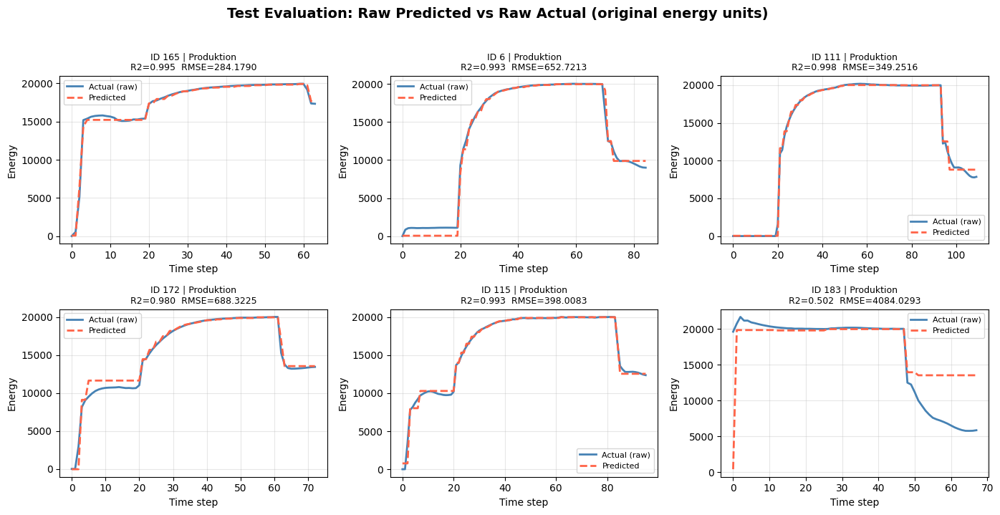

STEP 1 — RAW TRAIN/TEST SPLIT (before any preprocessing)
Total curves extracted : 279
Train curves : 237
Test curves  : 42  <- set aside, never touched until evaluation


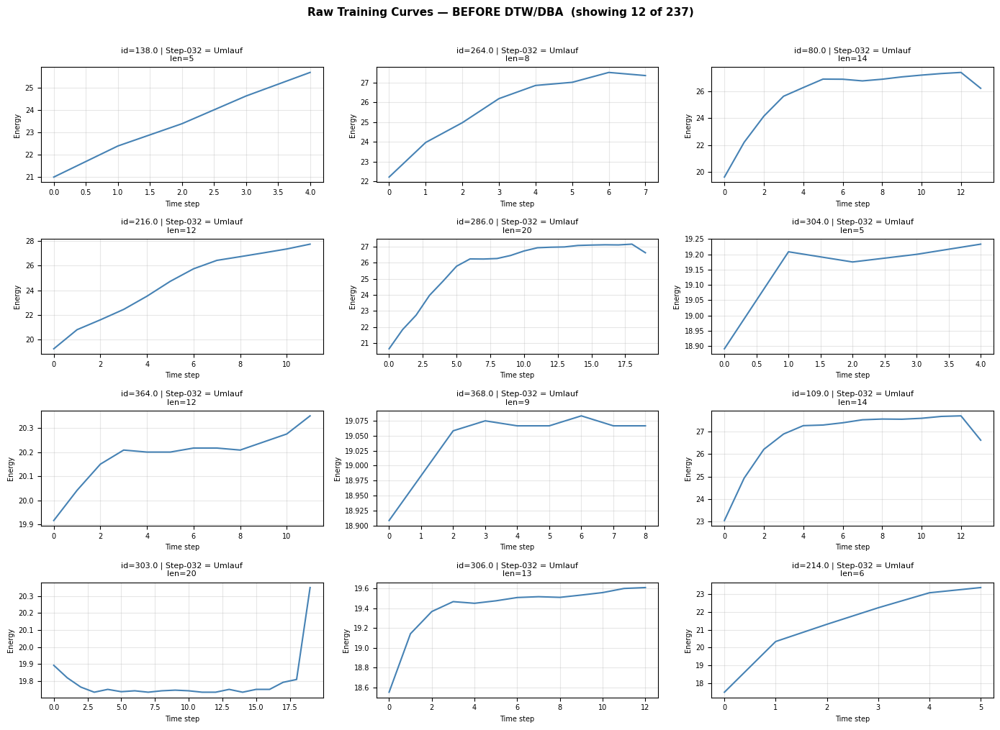


STEP 2 — BUILD + TRAIN PIPELINE  (train curves only)

[2a] Computing DBA barycenter from 237 train curves (fixed_length=100)...
    Barycenter length: 100 points

[2b] Aligning 237 train curves to DBA barycenter...
    Curve 1/237...
    Curve 24/237...
    Curve 47/237...
    Curve 70/237...
    Curve 93/237...
    Curve 116/237...
    Curve 139/237...
    Curve 162/237...
    Curve 185/237...
    Curve 208/237...
    Curve 231/237...

[2c] Attribute columns: {'attr_product': 'category', 'attr_product_id': 'numeric', 'attr_quantity': 'numeric', 'attr_sfg_brix_density': 'numeric', 'attr_sfg_product_info': 'numeric'}
     Regression dataset: 23700 rows (237 curves x 100 positions)

     Train: 189 curves / 18900 points
     Val  : 48 curves / 4800 points

[2d] Training — Linear Regression...
     Train  R2=0.6174  RMSE=1.2602
     Val    R2=-251064.8149  RMSE=1089.9705

[2d] Training — Gradient Boosting...
     Train  R2=0.9575  RMSE=0.4198
     Val    R2=0.4918  RMSE=1.5508

 Best mod

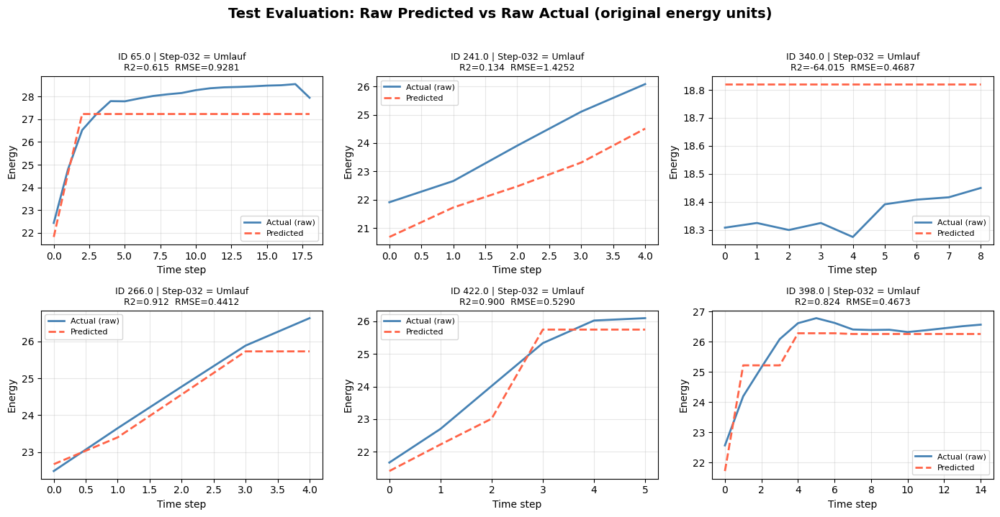

In [30]:


for process in process_datasets_to_model_sensors.keys():

    activites_to_model = process_datasets_to_model_sensors[process]['activities_to_model']
    objects_to_model = process_datasets_to_model_sensors[process]['objects_to_model']
    df_expanded = process_datasets_to_model_sensors[process]['expanded']

    VERBOSE = 1

    df = df_expanded.copy()

    for sensor in process_datasets_to_model_sensors[process]['sensors_to_model']:

        sensor_to_model = sensor

        # ------------------------------------------------------------------
        # STEP 1 — Split raw curves BEFORE any preprocessing
        # ------------------------------------------------------------------
        train_curves, test_curves = split_curves(
            df_expanded,
            variable=sensor_to_model,
            activities=activites_to_model,
            objects=objects_to_model,
            test_size=0.15,
            random_state=42,
            verbose=VERBOSE,
        )

        # ------------------------------------------------------------------
        # STEP 1b — Visualise raw training curves BEFORE DTW/DBA
        #           Skipped automatically when VERBOSE=0
        # ------------------------------------------------------------------
        plot_training_curves(
            train_curves,
            n_plot=12,
            verbose=VERBOSE,
        )

        # ------------------------------------------------------------------
        # STEP 2 — Build + train pipeline on train curves ONLY
        # ------------------------------------------------------------------
        custom_models = {
            'Linear Regression': LinearRegression,
            'Gradient Boosting': GradientBoostingRegressor,
        }

        pipeline = build_and_train_pipeline(
            train_curves,
            variable=sensor_to_model,
            fixed_length=100,
            val_size=0.2,
            random_state=42,
            models=custom_models,
            optimize_hyperparams=False,
            n_trials=20,
            verbose=VERBOSE,
        )

        # ------------------------------------------------------------------
        # STEP 3+4 — Predict on raw test curves and evaluate
        # ------------------------------------------------------------------
        metrics_df, agg_metrics = evaluate_pipeline_on_test(
            test_curves,
            pipeline,
            max_plot_curves=6,
            verbose=VERBOSE,
        )

In [ ]:
a

In [ ]:
process_datasets_to_model['process_2']['expanded']

In [ ]:
# import pandas as pd

# def expand_activities_to_timeseries(df_activities, df_energy, energy_cols=None):
#     """
#     For each activity, filter df_energy to the [timestamp_start, timestamp_end) interval,
#     then create rows combining activity info with each energy timestamp's data.
#     Append all into one DataFrame, preserving the complete time series per activity.
#     """
#     if energy_cols is None:
#         energy_cols = [col for col in df_energy.columns if col != 'datetime']
    
#     expanded_rows = []
    
#     for _, activity_row in df_activities.iterrows():
#         start = activity_row['timestamp_start_log']
#         end = activity_row['timestamp_end_log']
        
#         # Filter energy data within the activity's time interval
#         mask = (df_energy['datetime_energy'] >= start) & (df_energy['datetime_energy'] < end)
#         energy_subset = df_energy.loc[mask, ['datetime_energy'] + energy_cols]
        
#         # Create new rows: activity data + each energy row
#         for _, energy_row in energy_subset.iterrows():
#             new_row = activity_row.to_dict()
#             new_row.update(energy_row.to_dict())  # Merge energy data
#             expanded_rows.append(new_row)
    
#     return pd.DataFrame(expanded_rows)

# # Rename columns in df_event_log to add suffix '_log'
# df_activites = df_event_log.add_suffix('_log')

# # Rename columns in df_energy to add prefix '_sen', except 'datetime'
# df_energys = df_energy.add_suffix('_energy')

# # Usage: Use all sensor columns
# df_expanded = expand_activities_to_timeseries(df_activites, df_energys)

# # View result
# print(df_expanded.head())
# print(f"Shape: {df_expanded.shape}")

In [ ]:
df_expanded

In [ ]:
# Assuming df_expanded is already created from the previous code

# Group by datetime_energy and collect activities
overlaps = df_expanded.groupby('datetime_energy')['activity_log'].apply(list).reset_index()

# Add a column for the number of activities
overlaps['num_activities'] = overlaps['activity_log'].apply(len)

# # Filter for overlaps (more than one activity)
# overlapping = overlaps[overlaps['num_activities'] > 1]

overlaps

In [ ]:
df_expanded.columns

In [ ]:
df_expanded['activity_log'].unique()

In [ ]:
df_expanded['activity_log'].value_counts().head(20)

In [ ]:
df_expanded.columns

In [ ]:
df_expanded

In [ ]:
df_expanded

In [ ]:
import pandas as pd
import plotly.express as px

df = df_expanded.copy()

df = df[df['object_log'] == 'l01']

# Assuming your dataframe is named 'df' with columns 'datetime_energy' and 'n'
# Filter by the specific day
filtered_df = df[df['datetime_energy'].dt.date == pd.to_datetime('2024-11-07').date()]

# Create the plot
fig = px.line(filtered_df, x='datetime_energy', y='pro_volstrom_l/h_energy', title='Energy Demand on 2024-11-07')
fig.show()

In [ ]:
# df = df_energy.copy()
# df['datetime'] = pd.to_datetime(df['datetime'])  # Use the correct column name from df_expanded
# df = df[df['datetime'].dt.date == pd.to_datetime('2024-08-14').date()]  # Adjust date if needed

# fig = px.line(
#     df,
#     x='datetime',
#     y='flow_Heisswasser_30120FT721(WT5a)_5s',  # Changed to an energy feature column from df_expanded
#     title='Heating Power Energy Over Time',
#     labels={'activity_log'},
#     line_shape='linear',
#     #color='activity_type'
# )

# # Customize layout
# fig.update_layout(
#     xaxis_title='Timestamp Start',
#     yaxis_title='Heating Power Energy (kW)',
#     title_font_size=16,
#     xaxis=dict(tickangle=45),  # Rotate x-axis labels
#     template='plotly_white'
# )

# # Show the plot
# fig.show()

In [ ]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Identify columns ending with "_energy"
# energy_cols = [col for col in df_expanded.columns if col.endswith('_energy')]

# # Set up subplots: calculate rows and columns for grid
# n_cols = 3  # Adjust number of columns per row as needed
# n_rows = (len(energy_cols) + n_cols - 1) // n_cols

# fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
# axes = axes.flatten()

# for i, col in enumerate(energy_cols):
#     sns.lineplot(data=df_expanded, x='datetime_energy', y=col, ax=axes[i])
#     axes[i].set_title(f'{col}')
#     axes[i].tick_params(axis='x', rotation=45)

# # Hide any unused subplots
# for j in range(i + 1, len(axes)):
#     axes[j].set_visible(False)

# plt.tight_layout()
# plt.show()

In [ ]:
# df  = df_activites.copy()


# df['activity_log'].value_counts()

In [ ]:
df

In [ ]:
df = df_expanded.copy()

# Count unique timestamp_start_log per activity_log (i.e., unique activity instances per activity type)
unique_instances_per_activity = df.groupby('activity_log')['timestamp_start_log'].nunique()

print("Unique activity instances per activity type:")
print(unique_instances_per_activity)

In [ ]:
df['activity_log'].unique().tolist()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define activities
activities = [
#'Grundstellung',
 
 #'Vorwärmen des Warmwasserkreislaufs',
 'Warten auf Ziel',
#  'Materialvalidierung',
#  'Leitung zum Vorheizer füllen',
#  'Leitung zum HSM füllen',
  'Produktion',
#  'Spülen mit Wasser',
#  'Nachlauf',
#  'Spülen auf Gully',
#  'Fehler Tankanwahl Bestand',
#  'Warten auf Quelle'
 ]

# Get all energy columns (excluding datetime_energy)
energy_cols = [col for col in df_expanded.columns if col.endswith('_energy') and col != 'datetime_energy']

print(f"Activities: {activities}")
print(f"Energy variables: {energy_cols}")

df = df_expanded.copy()

df = df[df['object_log'] == 'l01']

for activity in activities:
    print(f"\nProcessing activity: {activity}")
    
    # Filter for this activity
    df_act = df[df['activity_log'] == activity].copy()
    
    # Create activity_instance_id
    df_act['activity_instance_id'] = df_act.groupby(['case_id_log', 'activity_log', 'timestamp_start_log']).ngroup()
    
    # Calculate total number of instances for this activity
    total_instances = df_act['activity_instance_id'].nunique()
    print(f"Total number of instances for {activity}: {total_instances}")
    
    # Calculate number of subplots
    n_vars = len(energy_cols)
    n_cols = 3  # Adjust columns per row
    n_rows = (n_vars + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
    # Ensure axes is always a flat array
    axes = np.array(axes).flatten()
    
    for i, variable in enumerate(energy_cols):
        if i >= len(axes):
            break  # Safety check
        ax = axes[i]
        
        # Count instances with data for this variable
        instances_with_data = 0
        for instance_id in df_act['activity_instance_id'].unique():
            instance_data = df_act[df_act['activity_instance_id'] == instance_id]
            if instance_data[variable].notna().any():  # At least one non-NaN value
                instances_with_data += 1
        
        print(f"  {variable}: {instances_with_data} instances have data (out of {total_instances})")
        
        # Collect and plot curves for this variable
        curve_count = 0
        for instance_id, group in df_act.groupby('activity_instance_id'):
            group = group.sort_values('datetime_energy')
            # Drop rows where either datetime_energy or variable is NaN
            group = group.dropna(subset=['datetime_energy', variable])
            values = group[variable].values
            times = group['datetime_energy']
            
            if len(values) >= 1 and len(times) >= 1:  # Include curves with at least 1 point
                # Calculate time elapsed in minutes from the start of this instance
                time_elapsed = (times - times.min()).dt.total_seconds() / 60
                
                # Plot the curve
                ax.plot(time_elapsed, values, alpha=0.7, linewidth=1, label=f'Instance {instance_id}')
                curve_count += 1
        
        print(f"  Number of curves plotted for {variable}: {curve_count}")
        
        if curve_count == 0:
            ax.text(0.5, 0.5, f'No valid curves for {variable}', 
                    ha='center', va='center', transform=ax.transAxes)
        
        ax.set_title(f'{variable}')
        ax.set_xlabel('Time (minutes)')
        ax.set_ylabel('Value')
        ax.grid(True, alpha=0.3)
        
        # If too many curves, don't show legend to avoid clutter
        if curve_count > 10:
            ax.legend().set_visible(False)
        elif curve_count > 0:
            ax.legend(fontsize=6, loc='best')
    
    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)
    
    plt.suptitle(f'Complete Energy Curves for Activity: {activity} (All Variables)', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

In [ ]:
df_expanded

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
import optuna  # Assuming optuna is installed

def train_position_based_regression(df_expanded, variable, activities, fixed_length=100, test_size=0.2, random_state=42, 
                                   models=None, optimize_hyperparams=False, n_trials=50):
    """
    Train position-based regression models for energy curve prediction.
    
    Parameters:
    -----------
    df_expanded : pd.DataFrame
        The expanded dataframe with energy data
    variable : str
        The energy variable column name
    activities : list
        List of activity names to include
    fixed_length : int
        Fixed length to resample curves to
    test_size : float
        Proportion of data for testing
    random_state : int
        Random state for reproducibility
    models : dict, optional
        Dictionary of model names to model classes (e.g., {'Gradient Boosting': GradientBoostingRegressor})
        If None, defaults to GradientBoostingRegressor and RandomForestRegressor
    optimize_hyperparams : bool, optional
        Whether to perform hyperparameter optimization with Optuna (default: False)
    n_trials : int, optional
        Number of Optuna trials for optimization (default: 50)
    
    Returns:
    --------
    dict : Results containing models, best model, and metadata
    """
    print("="*80)
    print("POSITION-BASED REGRESSION - NO ERROR COMPOUNDING!")
    print("="*80)
    
    # Default models if not provided
    if models is None:
        models = {
            'Gradient Boosting': GradientBoostingRegressor,
            'Random Forest': RandomForestRegressor
        }
    
    # Prepare data
    df_plot = df_expanded.copy()
    # Select necessary columns including object_attributes_log
    df_plot = df_plot[['case_id_log', 'activity_log', 'timestamp_start_log', 'datetime_energy', variable, 'object_attributes_log']]
    df_plot = df_plot[df_plot['activity_log'].isin(activities)]
    df_plot['timestamp_start'] = pd.to_datetime(df_plot['timestamp_start_log'])
    df_plot['datetime_energy'] = pd.to_datetime(df_plot['datetime_energy'])
    df_plot = df_plot.sort_values(['case_id_log', 'timestamp_start_log', 'datetime_energy'])
    
    # Create instance IDs
    df_plot['activity_instance_id'] = (
        df_plot.groupby(['case_id_log', 'activity_log', 'timestamp_start_log']).ngroup()
    )
    
    # Extract curves and attributes
    curves_data = []
    for instance_id, group in df_plot.groupby('activity_instance_id'):
        group = group.sort_values('datetime_energy').reset_index(drop=True)
        values = group[variable].dropna().values
        
        if len(values) >= 5:
            # Get attributes from the first row (assuming same per instance)
            attributes = group['object_attributes_log'].iloc[0] if not group['object_attributes_log'].empty else {}
            
            curves_data.append({
                'instance_id': instance_id,
                'activity': group['activity_log'].iloc[0],
                'original_values': values,
                'original_length': len(values),
                'attributes': attributes
            })
    
    print(f"\nResampling all curves to fixed length: {fixed_length} points")
    
    # Resample all curves to fixed length
    for curve in curves_data:
        x_old = np.linspace(0, 1, len(curve['original_values']))
        x_new = np.linspace(0, 1, fixed_length)
        curve['resampled_values'] = np.interp(x_new, x_old, curve['original_values'])
    
    print(f"Total curves: {len(curves_data)}")
    
    # Determine attribute columns and types
    if curves_data:
        all_keys = set()
        for curve in curves_data:
            all_keys.update(curve['attributes'].keys())
        all_keys = sorted(all_keys)
        
        # Check convertibility for each key
        key_types = {}
        for key in all_keys:
            is_numeric = True
            for curve in curves_data:
                if key in curve['attributes']:
                    try:
                        float(curve['attributes'][key])
                    except (ValueError, TypeError):
                        is_numeric = False
                        break
            key_types[key] = 'numeric' if is_numeric else 'category'
        
        print(f"Attribute columns: {key_types}")
    else:
        all_keys = []
        key_types = {}
    
    # Build position-based regression dataset
    regression_data = []
    
    for curve in curves_data:
        for position_idx in range(fixed_length):
            # Position as fraction (0 to 1)
            position_fraction = position_idx / (fixed_length - 1) if fixed_length > 1 else 0
            
            row = {
                'instance_id': curve['instance_id'],
                'activity': curve['activity'],
                'position_idx': position_idx,
                'position_fraction': position_fraction,
                'curve_length': curve['original_length'],
                'y': curve['resampled_values'][position_idx]
            }
            
            # Add attributes
            for key in all_keys:
                value = curve['attributes'].get(key, None)
                if key_types[key] == 'numeric':
                    try:
                        row[key] = float(value) if value is not None else np.nan
                    except (ValueError, TypeError):
                        row[key] = np.nan
                else:
                    row[key] = str(value) if value is not None else 'None'
            
            regression_data.append(row)
    
    df_regression = pd.DataFrame(regression_data)
    
    print(f"Regression dataset: {len(df_regression)} samples")
    print(f"  {len(curves_data)} curves × {fixed_length} points")
    
    # Prepare features
    feature_cols = ['position_idx', 'position_fraction', 'curve_length']
    X = df_regression[feature_cols].copy()
    y = df_regression['y'].copy()
    
    # Add activity
    X['activity'] = df_regression['activity']
    
    # Add attributes
    categorical_cols = ['activity']
    for key in all_keys:
        if key_types[key] == 'numeric':
            X[key] = df_regression[key]
        else:
            X[key] = df_regression[key]
            categorical_cols.append(key)
    
    # One-hot encode categorical columns
    X = pd.get_dummies(X, columns=categorical_cols, drop_first=True)
    
    # Split by COMPLETE CURVES
    unique_instances = df_regression['instance_id'].unique()
    train_instances, test_instances = train_test_split(
        unique_instances, test_size=test_size, random_state=random_state
    )
    
    train_mask = df_regression['instance_id'].isin(train_instances)
    test_mask = df_regression['instance_id'].isin(test_instances)
    
    X_train, X_test = X[train_mask], X[test_mask]
    y_train, y_test = y[train_mask], y[test_mask]
    
    print(f"\nTrain/Test split:")
    print(f"  Train: {len(train_instances)} curves, {len(X_train)} points")
    print(f"  Test: {len(test_instances)} curves, {len(X_test)} points")
    
    # Train models
    results_position = {}
    
    for name, model_class in models.items():
        print(f"\nTraining {name}...")
        
        if optimize_hyperparams:
            # Define objective function for Optuna
            def objective(trial):
                if name == 'Gradient Boosting':
                    params = {
                        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
                        'max_depth': trial.suggest_int('max_depth', 3, 10),
                        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
                        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
                        'random_state': random_state
                    }
                elif name == 'Random Forest':
                    params = {
                        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
                        'max_depth': trial.suggest_int('max_depth', 5, 20),
                        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
                        'random_state': random_state,
                        'n_jobs': -1
                    }
                else:
                    # For other models, no hyperparameter optimization defined
                    params = {}
                
                model = model_class(**params)
                model.fit(X_train, y_train)
                y_pred = model.predict(X_test)
                return r2_score(y_test, y_pred)
            
            # Run Optuna study
            study = optuna.create_study(direction='maximize')
            study.optimize(objective, n_trials=n_trials)
            
            # Get best parameters
            best_params = study.best_params
            if name == 'Gradient Boosting':
                best_params['random_state'] = random_state
            elif name == 'Random Forest':
                best_params['random_state'] = random_state
                best_params['n_jobs'] = -1
            
            print(f"  Best params: {best_params}")
            model = model_class(**best_params)
        else:
            # Use default parameters
            if name == 'Gradient Boosting':
                model = model_class(
                    n_estimators=200, max_depth=7, learning_rate=0.1,
                    subsample=0.8, random_state=random_state
                )
            elif name == 'Random Forest':
                model = model_class(
                    n_estimators=200, max_depth=12, min_samples_split=5,
                    random_state=random_state, n_jobs=-1
                )
            else:
                # For other models, try with random_state, if not supported, without
                try:
                    model = model_class(random_state=random_state)
                except TypeError:
                    model = model_class()
        
        model.fit(X_train, y_train)
        
        y_pred_train = model.predict(X_train)
        y_pred_test = model.predict(X_test)
        
        train_r2 = r2_score(y_train, y_pred_train)
        test_r2 = r2_score(y_test, y_pred_test)
        train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
        test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
        
        results_position[name] = {
            'model': model,
            'train_r2': train_r2,
            'test_r2': test_r2,
            'train_rmse': train_rmse,
            'test_rmse': test_rmse
        }
        
        print(f"  Train R²={train_r2:.4f}, RMSE={train_rmse:.2f}")
        print(f"  Test R²={test_r2:.4f}, RMSE={test_rmse:.2f}")
    
    # Select best model
    best_model_name_pos = max(results_position.keys(), key=lambda k: results_position[k]['test_r2'])
    best_model_pos = results_position[best_model_name_pos]['model']
    
    print(f"\n✓ Best model: {best_model_name_pos}")
    print(f"  Test R² = {results_position[best_model_name_pos]['test_r2']:.4f}")
    
    # Store for later use
    fixed_curve_length = fixed_length
    feature_columns_pos = X.columns.tolist()
    
    return {
        'results': results_position,
        'best_model': best_model_pos,
        'best_model_name': best_model_name_pos,
        'X_train': X_train,
        'X_test': X_test,
        'y_train': y_train,
        'y_test': y_test,
        'feature_columns': feature_columns_pos,
        'fixed_length': fixed_curve_length,
        'curves_data': curves_data,
        'test_instances': test_instances
    }

def calculate_metrics(y_true, y_pred, model_name="Model"):
    """
    Calculate comprehensive metrics: MAE, RMSE, WAPE, R²
    
    Parameters:
    -----------
    y_true : array-like
        True values
    y_pred : array-like
        Predicted values
    model_name : str
        Name of the model for display
    
    Returns:
    --------
    dict : Metrics dictionary
    """
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    
    # WAPE (Weighted Absolute Percentage Error)
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    wape = np.sum(np.abs(y_true - y_pred)) / np.sum(np.abs(y_true)) * 100
    
    return {
        'Model': model_name,
        'MAE': mae,
        'RMSE': rmse,
        'WAPE (%)': wape,
        'R²': r2
    }

def display_metrics_table(results_dict, y_test, X_test):
    """
    Display a table of metrics for all models in results_dict
    
    Parameters:
    -----------
    results_dict : dict
        Results from training function
    y_test : array-like
        Test true values
    X_test : pd.DataFrame
        Test features
    """
    metrics_list = []
    
    for model_name, model_info in results_dict['results'].items():
        model = model_info['model']
        y_pred = model.predict(X_test)
        metrics = calculate_metrics(y_test, y_pred, model_name)
        metrics_list.append(metrics)
    
    # Create DataFrame for table
    metrics_df = pd.DataFrame(metrics_list)
    
    # Display table
    print("\n" + "="*80)
    print("MODEL PERFORMANCE METRICS")
    print("="*80)
    print(metrics_df.to_string(index=False, float_format='%.4f'))
    
    # Highlight best model
    best_row = metrics_df.loc[metrics_df['R²'].idxmax()]
    print(f"\n✓ Best model: {best_row['Model']} (R² = {best_row['R²']:.4f})")
    
    return metrics_df

# Example usage:
# training_results = train_position_based_regression(df_expanded, 'flow_Kuehlturmwasser_30120FT701_5s_energy', ['Step-030 = Produktion', 'Step-032 = Umlauf'])
# metrics_table = display_metrics_table(training_results, training_results['y_test'], training_results['X_test'])

df = df_expanded.copy()

df = df[df['object_log'] == 'l01']

# Example with custom models and optimization:
from sklearn.linear_model import LinearRegression
custom_models = {'Linear Regression': LinearRegression, 'Gradient Boosting': GradientBoostingRegressor}
training_results = train_position_based_regression(df, 'pro_volstrom_l/h_energy', ['Produktion'], models=custom_models, optimize_hyperparams=False, n_trials=20)


In [ ]:
df_expanded

In [ ]:
def explore_energy_curves(activity, variable, df_expanded):
    """
    Explore and visualize energy curves for a specific activity and variable.
    
    Parameters:
    -----------
    activity : str
        The activity name to filter for (e.g., 'Step-032 = Umlauf')
    variable : str
        The energy variable column name (e.g., 'flow_Kuehlturmwasser_30120FT701_5s_energy')
    df_expanded : pd.DataFrame
        The expanded dataframe with energy data
    
    Returns:
    --------
    None : Displays the plot
    """
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np
    
    print(f"Processing activity: {activity}")
    print(f"Variable: {variable}")
    
    # Filter for this activity
    df_act = df_expanded[df_expanded['activity_log'] == activity].copy()
    
    # Create activity_instance_id
    df_act['activity_instance_id'] = df_act.groupby(['case_id_log', 'activity_log', 'timestamp_start_log']).ngroup()
    
    # Calculate total number of instances for this activity
    total_instances = df_act['activity_instance_id'].nunique()
    print(f"Total number of instances for {activity}: {total_instances}")
    
    # Count instances with data for this variable
    instances_with_data = 0
    for instance_id in df_act['activity_instance_id'].unique():
        instance_data = df_act[df_act['activity_instance_id'] == instance_id]
        if instance_data[variable].notna().any():  # At least one non-NaN value
            instances_with_data += 1
    
    print(f"{variable}: {instances_with_data} instances have data (out of {total_instances})")
    
    # Create a single plot for this variable
    fig, ax = plt.subplots(figsize=(15, 8))
    
    # Collect and plot curves for this variable
    curve_count = 0
    for instance_id, group in df_act.groupby('activity_instance_id'):
        group = group.sort_values('datetime_energy')
        # Drop rows where either datetime_energy or variable is NaN
        group = group.dropna(subset=['datetime_energy', variable])
        values = group[variable].values
        times = group['datetime_energy']
        
        if len(values) >= 1 and len(times) >= 1:  # Include curves with at least 1 point
            # Calculate time elapsed in minutes from the start of this instance
            time_elapsed = (times - times.min()).dt.total_seconds() / 60
            
            # Plot the curve
            ax.plot(time_elapsed, values, alpha=0.7, linewidth=1, label=f'Instance {instance_id}')
            curve_count += 1
    
    print(f"Number of curves plotted for {variable}: {curve_count}")
    
    if curve_count == 0:
        ax.text(0.5, 0.5, f'No valid curves for {variable}', 
                ha='center', va='center', transform=ax.transAxes)
    
    ax.set_title(f'{variable} - Original Curves for {activity}')
    ax.set_xlabel('Time (minutes)')
    ax.set_ylabel('Value')
    ax.grid(True, alpha=0.3)
    
    # If too many curves, don't show legend to avoid clutter
    if curve_count > 10:
        ax.legend().set_visible(False)
    elif curve_count > 0:
        ax.legend(fontsize=6, loc='best')
    
    plt.suptitle(f'Complete Energy Curves for Activity: {activity} ({variable})', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Example usage:
explore_energy_curves('Produktion', 'pro_volstrom_l/h_energy', df_expanded)


In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from dtw import dtw
from tslearn.barycenters import dtw_barycenter_averaging
import optuna
import matplotlib.pyplot as plt


# =============================================================================
# LEAKAGE AUDIT (confirmed clean)
# =============================================================================
# 1. split_curves      — split happens first; ngroup() is a pure index, not a
#                        learned statistic, so computing it pre-split is safe.
# 2. DBA barycenter    — computed from train_curves only.
# 3. DTW alignment     — applied to train_curves only.
# 4. _infer_key_types  — called on train_curves only; test curves use the
#                        resulting key_types dict at predict time.
# 5. get_dummies       — defined on training data; at predict time, test columns
#                        are aligned to feature_columns (missing → 0, extra → dropped).
#                        Val instances share training-level categories (correct).
# 6. predict_raw_curve — only the pipeline (fitted on train) is used; no test
#                        value influences any fitted statistic.
# =============================================================================


# =============================================================================
# STEP 1 — RAW SPLIT (before ANY preprocessing touches the data)
# =============================================================================

def split_curves(df_expanded, variable, activities, objects,
                 test_size=0.15, random_state=42, verbose=1):
    """
    Extract all activity curves and split into train/test sets.

    This is the very first operation. No DTW, no DBA, no normalisation —
    nothing touches the data before this split. Test curves are set aside as
    raw numpy arrays and never used again until final evaluation.

    Parameters
    ----------
    df_expanded  : pd.DataFrame
    variable     : str           — target energy column
    activities   : list[str]     — activity filter
    objects      : list[str]     — object_log filter
    test_size    : float         — fraction for test (default 0.15)
    random_state : int
    verbose      : int           — 0 = silent, 1 = full output

    Returns
    -------
    train_curves : list[dict]
    test_curves  : list[dict]
        Each dict: 'instance_id', 'activity', 'original_values' (np.ndarray),
                   'original_length', 'attributes'
    """
    if verbose:
        print("=" * 80)
        print("STEP 1 — RAW TRAIN/TEST SPLIT (before any preprocessing)")
        print("=" * 80)

    df = df_expanded.copy()
    df = df[['case_id_log', 'activity_log', 'object_log', 'timestamp_start_log',
             'datetime_energy', variable, 'object_attributes_log']]
    df = df[df['object_log'].isin(objects)]
    df = df[df['activity_log'].isin(activities)]
    df['timestamp_start'] = pd.to_datetime(df['timestamp_start_log'])
    df['datetime_energy'] = pd.to_datetime(df['datetime_energy'])
    df = df.sort_values(['case_id_log', 'timestamp_start_log', 'datetime_energy'])

    # ngroup() assigns a pure integer index — no statistic is learned here,
    # so computing it on the full (pre-split) df is safe.
    df['activity_instance_id'] = (
        df.groupby(['case_id_log', 'object_log', 'activity_log',
                    'timestamp_start_log']).ngroup()
    )

    curves_data = []
    for instance_id, group in df.groupby('activity_instance_id'):
        group  = group.sort_values('datetime_energy').reset_index(drop=True)
        values = group[variable].dropna().values
        if len(values) >= 5:
            attributes = (
                group['object_attributes_log'].iloc[0]
                if not group['object_attributes_log'].empty else {}
            )
            curves_data.append({
                'instance_id':     instance_id,
                'activity':        group['activity_log'].iloc[0],
                'original_values': values,
                'original_length': len(values),
                'attributes':      attributes,
            })

    if verbose:
        print(f"Total curves extracted : {len(curves_data)}")

    all_ids = list(range(len(curves_data)))
    train_ids, test_ids = train_test_split(
        all_ids, test_size=test_size, random_state=random_state
    )
    train_curves = [curves_data[i] for i in train_ids]
    test_curves  = [curves_data[i] for i in test_ids]

    if verbose:
        print(f"Train curves : {len(train_curves)}")
        print(f"Test curves  : {len(test_curves)}  <- set aside, never touched until evaluation")

    return train_curves, test_curves


# =============================================================================
# STEP 1b — VISUALISE RAW TRAINING CURVES (verbose=1 only, before DTW/DBA)
# =============================================================================

def plot_training_curves(train_curves, n_plot=12, figsize_per_row=(14, 2.5), verbose=1):
    """
    Plot a sample of raw training curves BEFORE any DTW/DBA transformation.
    Call this after split_curves() and before build_and_train_pipeline().

    Parameters
    ----------
    train_curves    : list[dict]  — from split_curves()
    n_plot          : int         — how many curves to show (default 12)
    figsize_per_row : tuple       — (width, height) per subplot row
    verbose         : int         — if 0, does nothing
    """
    if not verbose:
        return

    n_plot = min(n_plot, len(train_curves))
    n_cols = 3
    n_rows = int(np.ceil(n_plot / n_cols))
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(figsize_per_row[0], figsize_per_row[1] * n_rows)
    )
    axes = np.array(axes).flatten()

    # Sample evenly across the full training set for a representative overview
    indices = np.linspace(0, len(train_curves) - 1, n_plot, dtype=int)

    for ax, idx in zip(axes[:n_plot], indices):
        curve = train_curves[idx]
        ax.plot(curve['original_values'], color='steelblue', linewidth=1.5)
        ax.set_title(
            f"id={curve['instance_id']} | {curve['activity']}\n"
            f"len={curve['original_length']}",
            fontsize=8
        )
        ax.set_xlabel("Time step", fontsize=7)
        ax.set_ylabel("Energy",    fontsize=7)
        ax.tick_params(labelsize=7)
        ax.grid(True, alpha=0.3)

    for ax in axes[n_plot:]:
        ax.set_visible(False)

    plt.suptitle(
        f"Raw Training Curves — BEFORE DTW/DBA  "
        f"(showing {n_plot} of {len(train_curves)})",
        fontsize=11, fontweight='bold', y=1.01
    )
    plt.tight_layout()
    plt.show()


# =============================================================================
# INTERNAL HELPERS
# =============================================================================

def _align_curve_with_dtw(query, reference):
    """DTW-align a single query curve onto the reference grid (train only)."""
    alignment = dtw(query, reference, keep_internals=True)
    aligned = np.zeros(len(reference))
    counts  = np.zeros(len(reference))
    for qi, ri in zip(alignment.index1, alignment.index2):
        aligned[ri] += query[qi]
        counts[ri]  += 1
    counts  = np.where(counts == 0, 1, counts)
    aligned /= counts
    return aligned


def _infer_key_types(curves):
    """
    Determine numeric vs categorical for each attribute key.
    Always called only on train_curves — key_types is stored in the pipeline
    and reused at predict time without touching test data.
    """
    all_keys = sorted({k for c in curves for k in c['attributes'].keys()})
    key_types = {}
    for key in all_keys:
        is_numeric = True
        for curve in curves:
            if key in curve['attributes']:
                try:
                    float(curve['attributes'][key])
                except (ValueError, TypeError):
                    is_numeric = False
                    break
        key_types[key] = 'numeric' if is_numeric else 'category'
    return all_keys, key_types


def _build_feature_matrix(curves, all_keys, key_types, fixed_length,
                           value_key='resampled_values', include_target=True):
    """
    Flatten DTW-aligned train curves into a regression dataset.
    Each curve contributes `fixed_length` rows (one per barycenter position).
    Only ever called on train_curves.
    """
    rows = []
    for curve in curves:
        for position_idx in range(fixed_length):
            row = {
                'instance_id':       curve['instance_id'],
                'activity':          curve['activity'],
                'position_idx':      position_idx,
                'curve_length':      curve['original_length'],
            }
            if include_target:
                row['y'] = curve[value_key][position_idx]

            for key in all_keys:
                value = curve['attributes'].get(key, None)
                if key_types[key] == 'numeric':
                    try:
                        row[key] = float(value) if value is not None else np.nan
                    except (ValueError, TypeError):
                        row[key] = np.nan
                else:
                    row[key] = str(value) if value is not None else 'None'
            rows.append(row)

    return pd.DataFrame(rows)


# =============================================================================
# STEP 2 — BUILD + TRAIN PIPELINE  (train curves only)
# =============================================================================

def build_and_train_pipeline(
    train_curves,
    variable,
    fixed_length=100,
    val_size=0.2,
    random_state=42,
    models=None,
    optimize_hyperparams=False,
    n_trials=50,
    verbose=1,
):
    """
    Build the full preprocessing + training pipeline using ONLY train curves.

    Stages
    ------
    2a. DBA barycenter  — computed from train curves only
    2b. DTW alignment   — aligns each train curve to the barycenter
    2c. Feature matrix  — position + attribute features (train only)
    2d. Model training  — val split is done by instance_id (no leakage)
    2e. Best model      — selected by validation R2

    Parameters
    ----------
    train_curves         : list[dict]  — from split_curves()
    variable             : str         — informational label only
    fixed_length         : int         — DBA barycenter length
    val_size             : float       — fraction of train instances for val
    random_state         : int
    models               : dict        — {name: ModelClass}
    optimize_hyperparams : bool
    n_trials             : int
    verbose              : int         — 0 = silent, 1 = full output

    Returns
    -------
    pipeline : dict
        'model'            — best trained sklearn model
        'model_name'       — str
        'reference_curve'  — DBA barycenter (np.ndarray, length=fixed_length)
        'fixed_length'     — int
        'all_keys'         — attribute key names (inferred from train only)
        'key_types'        — {key: 'numeric'|'category'} (from train only)
        'feature_columns'  — exact column order the model expects
        'val_r2'           — float
        'all_results'      — dict with train/val metrics per model
    """
    if verbose:
        print("\n" + "=" * 80)
        print("STEP 2 — BUILD + TRAIN PIPELINE  (train curves only)")
        print("=" * 80)

    if models is None:
        models = {
            'Gradient Boosting': GradientBoostingRegressor,
            'Random Forest':     RandomForestRegressor,
        }

    # ------------------------------------------------------------------
    # 2a. DBA barycenter — train curves only
    # ------------------------------------------------------------------
    if verbose:
        print(f"\n[2a] Computing DBA barycenter from {len(train_curves)} train curves "
              f"(fixed_length={fixed_length})...")

    resampled_for_dba = np.array([
        np.interp(
            np.linspace(0, 1, fixed_length),
            np.linspace(0, 1, len(c['original_values'])),
            c['original_values']
        )
        for c in train_curves
    ])[:, :, np.newaxis]

    dba_barycenter  = dtw_barycenter_averaging(resampled_for_dba, barycenter_size=fixed_length)
    reference_curve = dba_barycenter[:, 0]

    if verbose:
        print(f"    Barycenter length: {len(reference_curve)} points")

    # ------------------------------------------------------------------
    # 2b. DTW-align train curves to barycenter  (test curves never touched)
    # ------------------------------------------------------------------
    if verbose:
        print(f"\n[2b] Aligning {len(train_curves)} train curves to DBA barycenter...")

    for i, curve in enumerate(train_curves):
        if verbose and i % max(1, len(train_curves) // 10) == 0:
            print(f"    Curve {i + 1}/{len(train_curves)}...")
        curve['resampled_values'] = _align_curve_with_dtw(
            curve['original_values'], reference_curve
        )

    # ------------------------------------------------------------------
    # 2c. Attribute types (train only) + feature matrix (train only)
    # ------------------------------------------------------------------
    all_keys, key_types = _infer_key_types(train_curves)

    if verbose:
        print(f"\n[2c] Attribute columns: {key_types}")

    df_reg = _build_feature_matrix(
        train_curves, all_keys, key_types, fixed_length,
        value_key='resampled_values', include_target=True
    )

    if verbose:
        print(f"     Regression dataset: {len(df_reg)} rows "
              f"({len(train_curves)} curves x {fixed_length} positions)")

    # Dummies defined on training data only. Val instances are a subset of
    # train curves so they share the same category levels — no unseen levels
    # can appear in the val set.
    categorical_cols = ['activity'] + [k for k in all_keys if key_types[k] == 'category']
    X_all = df_reg[['position_idx', 'curve_length']].copy()
    X_all = X_all.assign(activity=df_reg['activity'].values)
    for key in all_keys:
        X_all = X_all.assign(**{key: df_reg[key].values})
    X_all = pd.get_dummies(X_all, columns=categorical_cols, drop_first=True)
    y_all = df_reg['y'].copy()

    # Val split by instance_id: an entire curve is either train or val —
    # no point-level leakage between the two sets is possible.
    unique_instances     = df_reg['instance_id'].unique()
    train_inst, val_inst = train_test_split(
        unique_instances, test_size=val_size, random_state=random_state
    )
    train_mask = df_reg['instance_id'].isin(train_inst)
    val_mask   = df_reg['instance_id'].isin(val_inst)

    X_train, X_val = X_all[train_mask].copy(), X_all[val_mask].copy()
    y_train, y_val = y_all[train_mask].copy(), y_all[val_mask].copy()

    feature_columns = X_all.columns.tolist()

    if verbose:
        print(f"\n     Train: {len(train_inst)} curves / {len(X_train)} points")
        print(f"     Val  : {len(val_inst)} curves / {len(X_val)} points")

    # ------------------------------------------------------------------
    # 2d. Train models
    # ------------------------------------------------------------------
    all_results = {}

    for name, model_class in models.items():
        if verbose:
            print(f"\n[2d] Training — {name}...")

        if optimize_hyperparams:
            if not verbose:
                optuna.logging.set_verbosity(optuna.logging.WARNING)

            def objective(trial, name=name, model_class=model_class):
                if name == 'Gradient Boosting':
                    params = {
                        'n_estimators':  trial.suggest_int('n_estimators', 50, 300),
                        'max_depth':     trial.suggest_int('max_depth', 3, 10),
                        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
                        'subsample':     trial.suggest_float('subsample', 0.5, 1.0),
                        'random_state':  random_state,
                    }
                elif name == 'Random Forest':
                    params = {
                        'n_estimators':      trial.suggest_int('n_estimators', 50, 300),
                        'max_depth':         trial.suggest_int('max_depth', 5, 20),
                        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
                        'random_state':      random_state,
                        'n_jobs':            -1,
                    }
                else:
                    params = {}
                m = model_class(**params)
                m.fit(X_train, y_train)
                return r2_score(y_val, m.predict(X_val))

            study = optuna.create_study(direction='maximize')
            study.optimize(objective, n_trials=n_trials)
            best_params = study.best_params
            if name in ('Gradient Boosting', 'Random Forest'):
                best_params['random_state'] = random_state
            if name == 'Random Forest':
                best_params['n_jobs'] = -1
            if verbose:
                print(f"     Best params: {best_params}")
            model = model_class(**best_params)

        else:
            if name == 'Gradient Boosting':
                model = model_class(
                    n_estimators=200, max_depth=7, learning_rate=0.1,
                    subsample=0.8, random_state=random_state
                )
            elif name == 'Random Forest':
                model = model_class(
                    n_estimators=200, max_depth=12, min_samples_split=5,
                    random_state=random_state, n_jobs=-1
                )
            else:
                try:
                    model = model_class(random_state=random_state)
                except TypeError:
                    model = model_class()

        model.fit(X_train, y_train)

        train_pred = model.predict(X_train)
        val_pred   = model.predict(X_val)
        train_r2   = r2_score(y_train, train_pred)
        val_r2     = r2_score(y_val,   val_pred)
        train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
        val_rmse   = np.sqrt(mean_squared_error(y_val,   val_pred))

        if verbose:
            print(f"     Train  R2={train_r2:.4f}  RMSE={train_rmse:.4f}")
            print(f"     Val    R2={val_r2:.4f}  RMSE={val_rmse:.4f}")

        all_results[name] = {
            'model':      model,
            'train_r2':   train_r2,
            'val_r2':     val_r2,
            'train_rmse': train_rmse,
            'val_rmse':   val_rmse,
        }

    # ------------------------------------------------------------------
    # 2e. Select best model by val R2
    # ------------------------------------------------------------------
    best_name  = max(all_results, key=lambda k: all_results[k]['val_r2'])
    best_model = all_results[best_name]['model']

    if verbose:
        print(f"\n Best model : {best_name}  "
              f"(val R2={all_results[best_name]['val_r2']:.4f})")

    pipeline = {
        'model':           best_model,
        'model_name':      best_name,
        'reference_curve': reference_curve,
        'fixed_length':    fixed_length,
        'all_keys':        all_keys,
        'key_types':       key_types,
        'feature_columns': feature_columns,
        'val_r2':          all_results[best_name]['val_r2'],
        'all_results':     all_results,
    }

    return pipeline


# =============================================================================
# STEP 3 — PREDICT ON A SINGLE RAW CURVE
# =============================================================================

def predict_raw_curve(raw_values, activity, attributes, pipeline):
    """
    Predict energy for a single raw, unseen curve using the trained pipeline.

    Steps
    -----
    1. DTW the raw curve to reference_curve (train barycenter) to get a
       position mapping. Only the pipeline's reference_curve is used —
       no test statistics are computed.
    2. For each raw time step, look up its mapped barycenter position and
       build a feature row using pipeline's all_keys / key_types (train-derived).
    3. One-hot encode, then align columns to feature_columns:
         - missing columns (unseen category levels) -> filled with 0
         - extra columns (unseen test-only levels)  -> dropped
    4. model.predict() returns values in original energy units because the
       model was trained on DTW-aligned curves that preserve the original scale.

    Parameters
    ----------
    raw_values  : np.ndarray  — original, unwarped energy curve
    activity    : str
    attributes  : dict
    pipeline    : dict        — from build_and_train_pipeline()

    Returns
    -------
    y_pred : np.ndarray  shape (len(raw_values),), original energy units
    """
    reference_curve = pipeline['reference_curve']
    fixed_length    = pipeline['fixed_length']
    model           = pipeline['model']
    feature_columns = pipeline['feature_columns']
    all_keys        = pipeline['all_keys']
    key_types       = pipeline['key_types']

    alignment = dtw(raw_values, reference_curve, keep_internals=True)
    raw_to_ref_pos = {}
    for qi, ri in zip(alignment.index1, alignment.index2):
        if qi not in raw_to_ref_pos:
            raw_to_ref_pos[qi] = ri

    rows = []
    for raw_idx in range(len(raw_values)):
        ref_pos = raw_to_ref_pos.get(raw_idx, raw_idx)
        ref_pos = min(ref_pos, fixed_length - 1)

        row = {
            'position_idx':      ref_pos,
            'curve_length':      len(raw_values),
            'activity':          activity,
        }
        for key in all_keys:
            value = attributes.get(key, None)
            if key_types[key] == 'numeric':
                try:
                    row[key] = float(value) if value is not None else np.nan
                except (ValueError, TypeError):
                    row[key] = np.nan
            else:
                row[key] = str(value) if value is not None else 'None'
        rows.append(row)

    X_raw = pd.DataFrame(rows)

    categorical_cols = ['activity'] + [k for k in all_keys if key_types[k] == 'category']
    X_raw = pd.get_dummies(X_raw, columns=categorical_cols, drop_first=True)

    for col in feature_columns:
        if col not in X_raw.columns:
            X_raw[col] = 0
    X_raw = X_raw[feature_columns]

    return model.predict(X_raw)


# =============================================================================
# STEP 4 — EVALUATE ON RAW TEST CURVES
# =============================================================================

def evaluate_pipeline_on_test(test_curves, pipeline, max_plot_curves=6, verbose=1):
    """
    Evaluate the trained pipeline on completely unseen, raw test curves.
    Ground truth = raw_values (never warped, never seen during training).
    Predictions  = predict_raw_curve() output (original energy units).

    Plots are shown in a grid with 3 columns and as many rows as necessary.
    """

    if verbose:
        print("\n" + "=" * 80)
        print("STEP 4 — EVALUATION ON RAW TEST CURVES")
        print("  Ground truth : raw_values — never warped, never seen in training")
        print("  Predictions  : original energy units (DTW for positioning only)")
        print("=" * 80)

    per_curve_metrics = []
    all_true, all_pred = [], []

    for curve in test_curves:
        raw_values = curve['original_values']
        y_pred = predict_raw_curve(
            raw_values, curve['activity'], curve['attributes'], pipeline
        )

        mae  = mean_absolute_error(raw_values, y_pred)
        rmse = np.sqrt(mean_squared_error(raw_values, y_pred))
        r2   = r2_score(raw_values, y_pred)
        wape = np.sum(np.abs(raw_values - y_pred)) / np.sum(np.abs(raw_values)) * 100

        per_curve_metrics.append({
            'instance_id': curve['instance_id'],
            'activity':    curve['activity'],
            'n_points':    len(raw_values),
            'MAE':         mae,
            'RMSE':        rmse,
            'WAPE (%)':    wape,
            'R2':          r2,
        })

        all_true.extend(raw_values.tolist())
        all_pred.extend(y_pred.tolist())

    # Aggregate metrics
    all_true = np.array(all_true)
    all_pred = np.array(all_pred)

    agg_metrics = {
        'MAE':      mean_absolute_error(all_true, all_pred),
        'RMSE':     np.sqrt(mean_squared_error(all_true, all_pred)),
        'WAPE (%)': np.sum(np.abs(all_true - all_pred)) / np.sum(np.abs(all_true)) * 100,
        'R2':       r2_score(all_true, all_pred),
    }

    metrics_df = pd.DataFrame(per_curve_metrics)

    if verbose:
        print("\nPer-curve metrics:")
        print(metrics_df.to_string(index=False, float_format='%.4f'))

    print("\nAggregate metrics across all test curves:")
    for k, v in agg_metrics.items():
        print(f"  {k:12s}: {v:.4f}")

    # ------------------------------------------------------------------
    # GRID PLOTTING (3 columns)
    # ------------------------------------------------------------------
    if verbose:
        n_plot = min(max_plot_curves, len(test_curves))

        n_cols = 4
        n_rows = int(np.ceil(n_plot / n_cols))

        fig, axes = plt.subplots(
            n_rows, n_cols,
            figsize=(14, 3.5 * n_rows)
        )

        axes = np.array(axes).reshape(-1)  # flatten safely

        for ax, curve in zip(axes[:n_plot], test_curves[:n_plot]):
            raw_values = curve['original_values']
            y_pred = predict_raw_curve(
                raw_values, curve['activity'], curve['attributes'], pipeline
            )

            r2_val   = r2_score(raw_values, y_pred)
            rmse_val = np.sqrt(mean_squared_error(raw_values, y_pred))

            ax.plot(raw_values, label='Actual (raw)', color='steelblue', linewidth=2)
            ax.plot(y_pred, label='Predicted', color='tomato',
                    linewidth=2, linestyle='--')

            ax.set_title(
                f"ID {curve['instance_id']} | {curve['activity']}\n"
                f"R2={r2_val:.3f}  RMSE={rmse_val:.4f}",
                fontsize=9
            )
            ax.set_xlabel("Time step")
            ax.set_ylabel("Energy")
            ax.grid(True, alpha=0.3)
            ax.legend(fontsize=8)

        # Hide unused subplots
        for ax in axes[n_plot:]:
            ax.set_visible(False)

        plt.suptitle(
            "Test Evaluation: Raw Predicted vs Raw Actual (original energy units)",
            fontsize=14, fontweight='bold', y=1.02
        )
        plt.tight_layout()
        plt.show()

    return metrics_df, agg_metrics


# =============================================================================
# ENTRY POINT
# =============================================================================

if __name__ == "__main__":

    VERBOSE = 1   # 0 = silent (only aggregate metrics printed at the end)
                  # 1 = full output: progress logs, per-curve table, all plots

    df = df_expanded.copy()

    # ------------------------------------------------------------------
    # STEP 1 — Split raw curves BEFORE any preprocessing
    # ------------------------------------------------------------------
    train_curves, test_curves = split_curves(
        df,
        variable='pro_volstrom_l/h_energy',
        activities=['Produktion'],
        objects=['l01'],
        test_size=0.15,
        random_state=42,
        verbose=VERBOSE,
    )

    # ------------------------------------------------------------------
    # STEP 1b — Visualise raw training curves BEFORE DTW/DBA
    #           Skipped automatically when VERBOSE=0
    # ------------------------------------------------------------------
    plot_training_curves(
        train_curves,
        n_plot=12,
        verbose=VERBOSE,
    )

    # ------------------------------------------------------------------
    # STEP 2 — Build + train pipeline on train curves ONLY
    # ------------------------------------------------------------------
    custom_models = {
        'Linear Regression': LinearRegression,
        'Gradient Boosting': GradientBoostingRegressor,
    }

    pipeline = build_and_train_pipeline(
        train_curves,
        variable='pro_volstrom_l/h_energy',
        fixed_length=100,
        val_size=0.2,
        random_state=42,
        models=custom_models,
        optimize_hyperparams=False,
        n_trials=20,
        verbose=VERBOSE,
    )

    # ------------------------------------------------------------------
    # STEP 3+4 — Predict on raw test curves and evaluate
    # ------------------------------------------------------------------
    metrics_df, agg_metrics = evaluate_pipeline_on_test(
        test_curves,
        pipeline,
        max_plot_curves=8,
        verbose=VERBOSE,
    )